In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [10]:
xls = pd.ExcelFile(rf"C:\Users\admin\Downloads\categorisation and graphs\Data Categorisation Model\Data Categorisation Model\Whatsapp_Final_Data_HINDI_POSTDATA_1-7Jan_Categorised_MAIN.xlsx")
df_hindi_comp = pd.read_excel(xls, 'Sheet1')
# df_english_comp = pd.read_excel(xls, 'English')

In [11]:
df_hindi_comp.shape

(949, 11)

In [14]:
df_hindi_comp.shape

(949, 11)

In [15]:
df_hindi_comp.head()

,Unnamed: 0,Channel_Name,Channel_Language,Post_Content,Links,Engagement,Date,Time,Poll,Timestamp,Category
0,0,Aaj Tak,Hindi,"भरोसा था, भरोसा है, भरोसा रहेगा... 2025 में भी...",https://tinyurl.com/5n75ydcd,1958,1/1/2025,00:36,No,09 January 2025 17:10:19,HEADLINES
1,1,Aaj Tak,Hindi,Today's Horoscope: आज कैसा रहेगा आपका दिन?\nजा...,https://www.youtube.com/watch?v=Nq9yVKBDe_o,217,1/1/2025,08:57,No,09 January 2025 17:10:20,Horoscope
2,2,Aaj Tak,Hindi,साल 2025 के पहले दिन देश के अलग-अलग हिस्सों मे...,https://tinyurl.com/4zscvbr6,2660,1/1/2025,10:02,No,09 January 2025 17:10:21,HEADLINES
3,3,Aaj Tak,Hindi,आम आदमी पार्टी (AAP) के संयोजक अरविंद केजरीवाल...,https://tinyurl.com/yc3sdmj9,1973,1/1/2025,11:19,No,09 January 2025 17:10:22,Political
4,4,Aaj Tak,Hindi,2025 में भारतीय टीम की पहली फ्रेश सीरीज इंग्लै...,https://tinyurl.com/z5typ2jd,3044,1/1/2025,12:29,No,09 January 2025 17:10:23,Sports


In [16]:
list(df_hindi_comp.columns)

['Unnamed: 0',
 'Channel_Name',
 'Channel_Language',
 'Post_Content',
 'Links',
 'Engagement',
 'Date',
 'Time',
 'Poll',
 'Timestamp',
 'Category']

In [17]:
df_hindi_comp = df_hindi_comp[['Date',
                               'Time',
                               'Channel_Name',
                               'Post_Content',
                               'Links',
                               'Category',
                               'Engagement', 
                               # 'VOTES ON POLL'
 ]]

In [18]:
df_hindi_comp

,Date,Time,Channel_Name,Post_Content,Links,Category,Engagement
0,1/1/2025,00:36,Aaj Tak,"भरोसा था, भरोसा है, भरोसा रहेगा... 2025 में भी...",https://tinyurl.com/5n75ydcd,HEADLINES,1958
1,1/1/2025,08:57,Aaj Tak,Today's Horoscope: आज कैसा रहेगा आपका दिन?\nजा...,https://www.youtube.com/watch?v=Nq9yVKBDe_o,Horoscope,217
2,1/1/2025,10:02,Aaj Tak,साल 2025 के पहले दिन देश के अलग-अलग हिस्सों मे...,https://tinyurl.com/4zscvbr6,HEADLINES,2660
3,1/1/2025,11:19,Aaj Tak,आम आदमी पार्टी (AAP) के संयोजक अरविंद केजरीवाल...,https://tinyurl.com/yc3sdmj9,Political,1973
4,1/1/2025,12:29,Aaj Tak,2025 में भारतीय टीम की पहली फ्रेश सीरीज इंग्लै...,https://tinyurl.com/z5typ2jd,Sports,3044
...,...,...,...,...,...,...,...
944,1/7/2025,12:51,Zee News,"हर दिन निकलता है कई क्विंटल सोना, असली KGF है ...",https://zeenews.india.com/hindi/photos/america...,HEADLINES,23
945,1/7/2025,16:15,Zee News,"Delhi Election 2025: क्या पता कल हम हो न हों, ...",https://zeenews.india.com/hindi/india/delhi-nc...,HEADLINES,19
946,1/7/2025,16:16,Zee News,Delhi Election Date: दिल्ली में हो गया जंग का ...,https://zeenews.india.com/hindi/india/delhi-nc...,ELECTION,23
947,1/7/2025,17:45,Zee News,Delhi Chunav: ना खुराना चले ना वर्मा फिर आईं स...,https://zeenews.india.com/hindi/india/delhi-vi...,Political,22


In [19]:
df_hindi_comp.columns =['Date', 'Time', 'Channel', 'Stories', 'url', 'Category', 'Engagement']

In [20]:
list(df_hindi_comp.Channel.unique())

['Aaj Tak',
 'ABP News',
 'Good News Today',
 'India TV',
 'NDTV India',
 'News - Dainik Bhaskar Hindi - India, Rajasthan, Madhya Pradesh, MP, CG, UP, Bihar, Delhi',
 'News18 India',
 'Republic Bharat',
 'The Lallantop',
 'Times Now Navbharat',
 'TV9 Bharatvarsh',
 'Zee News']

In [21]:
df_hindi_comp["Channel"].replace(['News - Dainik Bhaskar Hindi - India, Rajasthan, Madhya Pradesh, MP, CG, UP'],"Dainik Bhaskar",inplace=True)
df_hindi_comp["Channel"].replace(['News - Dainik Bhaskar Hindi - India, Rajasthan, Madhya Pradesh, MP, CG, UP, Bihar, Delhi'],"Dainik Bhaskar",inplace=True)
# df_hindi_comp["Channel"].replace(['\n \t\nDainik Bhaskar Hindi News\n'],'Dainik Bhaskar Hindi News',inplace=True)

C:\Users\admin\AppData\Local\Temp\ipykernel_32120\3105375272.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_hindi_comp["Channel"].replace(['News - Dainik Bhaskar Hindi - India, Rajasthan, Madhya Pradesh, MP, CG, UP'],"Dainik Bhaskar",inplace=True)


In [22]:
list(df_hindi_comp.Channel.unique())

['Aaj Tak',
 'ABP News',
 'Good News Today',
 'India TV',
 'NDTV India',
 'Dainik Bhaskar',
 'News18 India',
 'Republic Bharat',
 'The Lallantop',
 'Times Now Navbharat',
 'TV9 Bharatvarsh',
 'Zee News']

In [23]:
df_hindi_comp.dropna(subset=['Channel'],inplace=True)
df_hindi_comp.shape

(949, 7)

In [24]:
list(df_hindi_comp.Channel.unique())

['Aaj Tak',
 'ABP News',
 'Good News Today',
 'India TV',
 'NDTV India',
 'Dainik Bhaskar',
 'News18 India',
 'Republic Bharat',
 'The Lallantop',
 'Times Now Navbharat',
 'TV9 Bharatvarsh',
 'Zee News']

In [25]:
list(df_hindi_comp.Category.sort_values().unique())

['Bollywood',
 'Business',
 'CRIME',
 'EDUCATION',
 'ELECTION',
 'ENTERTAINMENT',
 'FESTIVAL',
 'HEADLINES',
 'Health',
 'Horoscope',
 'International',
 'OLYMPICS',
 'Political',
 'QUIZ',
 'Sports',
 'TRENDING',
 'TV Show',
 'Technology',
 'VIRAL']

In [26]:
# df_hindi_comp["Category"].replace(['Astro ','astro','AStro',"Astro"],"Astrology",inplace=True)
df_hindi_comp["Category"].replace(['BOLLYWOOD ','bollywood','BOLLYWOOD','BOLLYWOOD ',],"BOLLYWOOD",inplace=True)
# df_hindi_comp["Category"].replace(['buisness news ','business','Busniess','BUISINESS ','BUSINESS','BUSINESS ', 'Business','Busniess'],"Busniess",inplace=True)
# df_hindi_comp["Category"].replace(['HEALTH','HEALTH ','HEALTRH ','Health'],"Health",inplace=True)
df_hindi_comp["Category"].replace(['HOROSCOPE','HOROSCOPE '],'Horoscope',inplace=True)
df_hindi_comp["Category"].replace(['International','International news','international news', 'INTERNATIONAL','INTERNATIONAL ','International'],"International",inplace=True)
# df_hindi_comp["Category"].replace(['PROMOTION','PROMOTION ','Promotion','PROmotion'],'Promotion',inplace=True)
df_hindi_comp["Category"].replace(['SPORTS','sports ','sports','sport','SPorts','Sports ', 'SPORTS','SPORTS '],"Sports",inplace=True)
# df_hindi_comp["Category"].replace(['TRENDING ',"Trending News","Trending","Trending News ","trending News","trending News","trending news","TRENDIng news","Trending NEws","Trending news","Trending Stories",'TrendIng news', 'TRENDING','TRENDING\n','TRENDING ','TTRENDING ',],"TRENDING",inplace=True)
# df_hindi_comp["Category"].replace([' TV SHOW','TV show','TV SHOW','TV show ','TV SHOW ',],"TV SHOW",inplace=True)
df_hindi_comp["Category"].replace(['TECH ','Tech','tech news','TECH','TECH '],'Technology',inplace=True)
df_hindi_comp["Category"].replace(['WAR ','WAR','WAR ','war'],"War",inplace=True)
# df_hindi_comp["Category"].replace(['International news','international news', 'INTERNATIONAL','INTERNATIONAL ','International','international ','iNTERNATIONAL','INTERNATIONAL'],'INTERNATIONAL',inplace=True)
# df_hindi_comp["Category"].replace(['INTRODUCTION '],'Introduction',inplace=True)
# df_hindi_comp["Category"].replace([' entertainment news','entertainment news'],"Entertainment",inplace=True)
# df_hindi_comp["Category"].replace(['quize','QUIZ ','Quiz','Quiz'],"QUIZ",inplace=True)
# df_hindi_comp["Category"].replace(['bollywood','BOLLYWOOD','BOLLYWOOD ',],"Bollywood",inplace=True)
# df_hindi_comp["Category"].replace(['education news',],"Educational",inplace=True)
# df_hindi_comp["Category"].replace(['auto news','auto news'],"Automobile",inplace=True)
# df_hindi_comp["Category"].replace(['pOLITICAL','POLITICAL'],'POLITICAL',inplace=True)
# df_hindi_comp["Category"].replace(['BULLETIN'],'HEADLINES',inplace=True)


C:\Users\admin\AppData\Local\Temp\ipykernel_32120\2905678273.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_hindi_comp["Category"].replace(['BOLLYWOOD ','bollywood','BOLLYWOOD','BOLLYWOOD ',],"BOLLYWOOD",inplace=True)


In [27]:
df_hindi_comp.Category.value_counts()

Category
HEADLINES        392
TRENDING         142
Political        112
VIRAL             77
CRIME             48
Sports            47
Horoscope         36
International     22
ELECTION          16
Bollywood         15
Business          10
Health             7
EDUCATION          7
FESTIVAL           5
ENTERTAINMENT      5
QUIZ               3
OLYMPICS           2
Technology         2
TV Show            1
Name: count, dtype: int64

In [28]:
list(df_hindi_comp.Category.sort_values().unique())




['Bollywood',
 'Business',
 'CRIME',
 'EDUCATION',
 'ELECTION',
 'ENTERTAINMENT',
 'FESTIVAL',
 'HEADLINES',
 'Health',
 'Horoscope',
 'International',
 'OLYMPICS',
 'Political',
 'QUIZ',
 'Sports',
 'TRENDING',
 'TV Show',
 'Technology',
 'VIRAL']

In [29]:
df_hindi_comp.to_excel("Hindi_WA_Dec_1_31_2024.xlsx")

In [30]:
df_hindi_comp.Category.sort_values().nunique()

19

In [31]:
df_hindi_comp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 949 entries, 0 to 948
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Date        949 non-null    object
 1   Time        949 non-null    object
 2   Channel     949 non-null    object
 3   Stories     949 non-null    object
 4   url         920 non-null    object
 5   Category    949 non-null    object
 6   Engagement  949 non-null    int64 
dtypes: int64(1), object(6)
memory usage: 52.0+ KB


In [32]:
len(df_hindi_comp.Engagement.unique())

290

In [33]:
df_hindi_comp.Engagement.unique()

array([1958,  217, 2660, 1973, 3044, 1817, 2086, 1909, 4343, 1065, 4912,
       3536, 1359, 4033,  181, 2051, 1105, 1515,  933, 2145, 2058, 2218,
       3994, 2458, 2929, 1502, 3508,  218,  851, 3678, 1839, 3410, 3316,
       2794,  652, 1977, 2403, 4077, 3043, 7730,  190,  968, 2421, 2011,
       2958, 2415, 2435, 1878, 3165, 4574, 3265, 4797,  202, 2302,  727,
       3195, 2119, 3775, 2018,  304, 6607, 4564, 1600, 3318,  186, 1820,
       2671, 3732, 3997, 4642, 2961, 1181, 1475,  208, 1677, 3272, 2700,
        207, 1157, 2613, 3135, 2997, 3981, 1640, 2090, 1539, 2335, 2477,
       2283, 7250,   66,   80,  108,  114,   61,   57,   98,   79,   82,
         75,  133,   67,   86,  187,  212,   96,   68,  125,  101,   44,
        104,   64,   73,   49,   63,   47,   78,   62,   51,  171,   77,
         85,   54,   41,   52,  149,   72,   94,   58,  110,   42,  107,
        103,   99,   92,  156,  169,   50,   65,   56,  112,  148,   84,
        153,   93,  150,   59,  106,  115,  131,  1

In [99]:
# # df_hindi_comp["Engagement"] = df_hindi_comp["Engagement"].astype(int)
# # df_hindi_comp['Engagement'] = df_hindi_comp['Engagement'].str.replace(',', '')
# # df_hindi_comp['Engagement'] = df_hindi_comp['Engagement'].str.replace(np.nan, '0').astype(int)
# # Remove commas

# df_hindi_comp['Engagement'] = df_hindi_comp['Engagement'].str.replace(',', '')

# # Replace 'inf' with NaN
# df_hindi_comp['Engagement'] = df_hindi_comp['Engagement'].replace('inf', pd.NA)

# # Fill NaN values with 0 (or any other integer value)
# df_hindi_comp['Engagement'] = df_hindi_comp['Engagement'].fillna(0)

# # Convert to integer
# df_hindi_comp['Engagement'] = df_hindi_comp['Engagement'].astype(int)
# df_hindi_comp.Engagement.unique()

In [34]:
len(df_hindi_comp.Engagement.unique())

290

In [35]:
df_avg_engagement = pd.DataFrame(df_hindi_comp.groupby(["Channel"])["Engagement"].mean().sort_values(ascending=False).reset_index())
df_avg_engagement.rename(columns={'Engagement': 'Avg. Engagement per post'}, inplace=True)
df_avg_engagement

,Channel,Avg. Engagement per post
0,Aaj Tak,2483.677778
1,News18 India,176.494949
2,ABP News,94.170213
3,Dainik Bhaskar,89.185714
4,Zee News,31.087719
5,Good News Today,28.754386
6,The Lallantop,11.558824
7,NDTV India,10.000000
8,Republic Bharat,9.815385
9,TV9 Bharatvarsh,9.609375


In [36]:
df_total_posts = pd.DataFrame(df_hindi_comp.groupby(["Channel"])["Stories"].count().sort_values(ascending=False).reset_index())
df_total_posts.rename(columns={'Stories': 'Total No. of Posts'}, inplace=True)
df_total_posts

,Channel,Total No. of Posts
0,Dainik Bhaskar,210
1,ABP News,141
2,News18 India,99
3,Aaj Tak,90
4,India TV,71
5,Republic Bharat,65
6,TV9 Bharatvarsh,64
7,Times Now Navbharat,58
8,Good News Today,57
9,Zee News,57


In [37]:
result_df = pd.merge(df_avg_engagement, df_total_posts, on=['Channel'], how='left')
# result_df = result_df.sort_values(by='Date',ascending=True)
result_df.to_csv("AverageEngagementVsTotalPostsperChannel_02012023.csv")
result_df

,Channel,Avg. Engagement per post,Total No. of Posts
0,Aaj Tak,2483.677778,90
1,News18 India,176.494949,99
2,ABP News,94.170213,141
3,Dainik Bhaskar,89.185714,210
4,Zee News,31.087719,57
5,Good News Today,28.754386,57
6,The Lallantop,11.558824,34
7,NDTV India,10.000000,3
8,Republic Bharat,9.815385,65
9,TV9 Bharatvarsh,9.609375,64


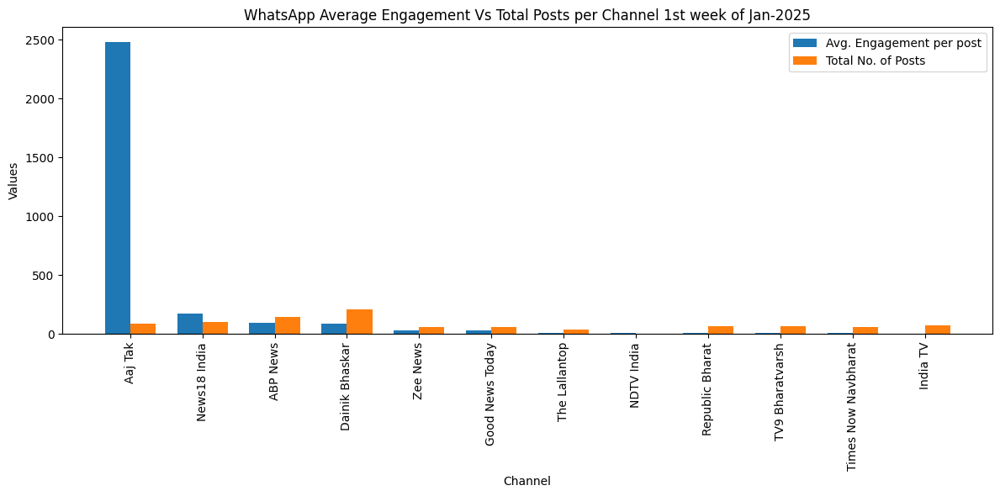

In [40]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# # Create a DataFrame with the data
# data = {
#     'Channel': ['Aaj Tak', 'News 18 India', 'ABP News', 'Dainik Bhaskar Hindi News', 'ZEE News', 'Republic Bharat', 'Times Now Navbharat', 'TV9 Bharatvarsh', 'Good News Today', 'NDTV India', 'India TV'],
#     'Avg. Engagement per post': [1190.44, 815.70, 454.69, 291.71, 39.17, 19.46, 18.00, 8.08, 7.24, 6.36, 5.54],
#     'Total No. of Posts': [210, 244, 260, 203, 399, 204, 64, 49, 98, 57, 478]
# }

df = result_df

# Set the figure size
plt.figure(figsize=(12, 6))

# Create an array for the x-axis positions
x = np.arange(len(df['Channel']))

# Set the width of each bar
bar_width = 0.35

# Create the bar plots side-by-side
plt.bar(x - bar_width/2, df['Avg. Engagement per post'], bar_width, label='Avg. Engagement per post')
plt.bar(x + bar_width/2, df['Total No. of Posts'], bar_width, label='Total No. of Posts')

# Add labels and title
plt.xlabel('Channel')
plt.xticks(x, df['Channel'], rotation=90)
plt.ylabel('Values')
plt.title('WhatsApp Average Engagement Vs Total Posts per Channel 1st week of Jan-2025')

# Add a legend
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()


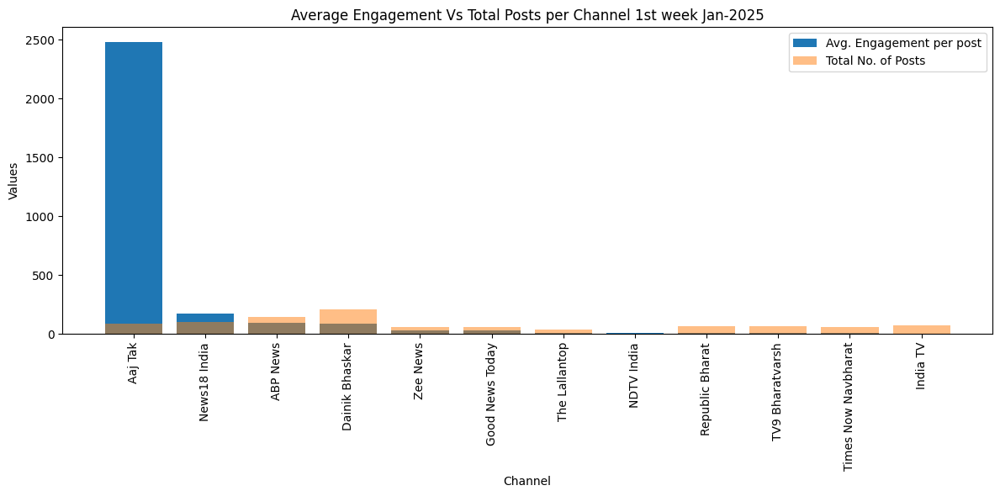

In [42]:
import pandas as pd
import matplotlib.pyplot as plt

# # Create a DataFrame with the data
# data = {
#     'Channel': ['Aaj Tak', 'News 18 India', 'ABP News', 'Dainik Bhaskar Hindi News', 'ZEE News', 'Republic Bharat', 'Times Now Navbharat', 'TV9 Bharatvarsh', 'Good News Today', 'NDTV India', 'India TV'],
#     'Avg. Engagement per post': [1190.44, 815.70, 454.69, 291.71, 39.17, 19.46, 18.00, 8.08, 7.24, 6.36, 5.54],
#     'Total No. of Posts': [210, 244, 260, 203, 399, 204, 64, 49, 98, 57, 478]
# }

df = result_df

# Set the figure size
plt.figure(figsize=(12, 6))

# Create the bar plots
plt.bar(df['Channel'], df['Avg. Engagement per post'], label='Avg. Engagement per post')
plt.bar(df['Channel'], df['Total No. of Posts'], label='Total No. of Posts', alpha=0.5)

# Add labels and title
plt.xlabel('Channel')
plt.xticks(rotation=90)
plt.ylabel('Values')
plt.title('Average Engagement Vs Total Posts per Channel 1st week Jan-2025')

# Add a legend
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()


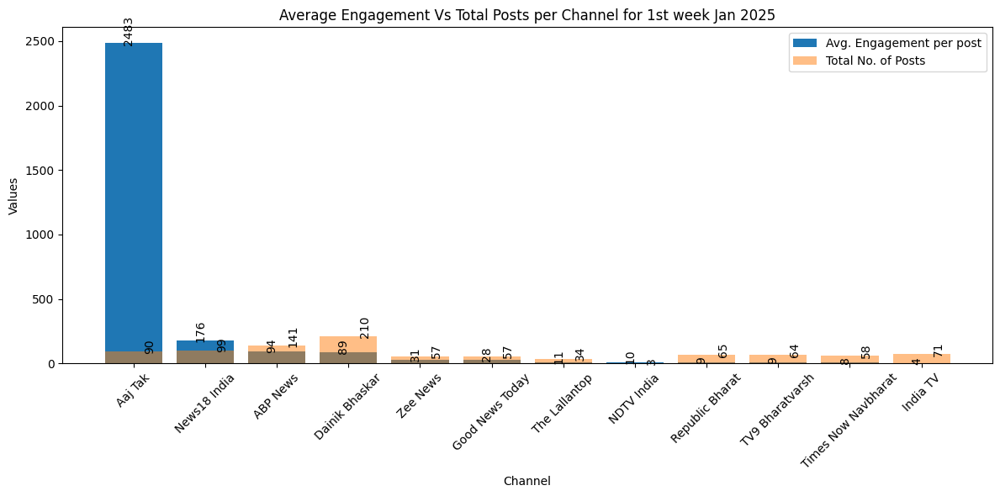

In [44]:
import pandas as pd
import matplotlib.pyplot as plt

# Sample DataFrame
# data = {
#     'Channel': ['Aaj Tak', 'News 18 India', 'ABP News', 'Dainik Bhaskar Hindi News', 'ZEE News', 'Republic Bharat', 'Times Now Navbharat', 'TV9 Bharatvarsh', 'Good News Today', 'NDTV India', 'India TV'],
#     'Avg. Engagement per post': [1190.44, 815.70, 454.69, 291.71, 39.17, 19.46, 18.00, 8.08, 7.24, 6.36, 5.54],
#     'Total No. of Posts': [210, 244, 260, 203, 399, 204, 64, 49, 98, 57, 478]
# }

df = result_df

# Set the figure size
plt.figure(figsize=(12, 6))

# Create the bar plots
bars1 = plt.bar(df['Channel'], df['Avg. Engagement per post'], label='Avg. Engagement per post')
bars2 = plt.bar(df['Channel'], df['Total No. of Posts'], label='Total No. of Posts', alpha=0.5)

# Add values inside the bars vertically
for bar1, bar2 in zip(bars1, bars2):
    plt.text(bar1.get_x() + bar1.get_width() / 2 - 0.15, bar1.get_height() + 5, int(bar1.get_height()), fontsize=10, rotation=90)
    plt.text(bar2.get_x() + bar2.get_width() / 2 + 0.15, bar2.get_height() + 5, int(bar2.get_height()), fontsize=10, rotation=90)

# Add labels and title
plt.xlabel('Channel')
plt.xticks(rotation=45)
plt.ylabel('Values')
plt.title('Average Engagement Vs Total Posts per Channel for 1st week Jan 2025')

# Add a legend
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()


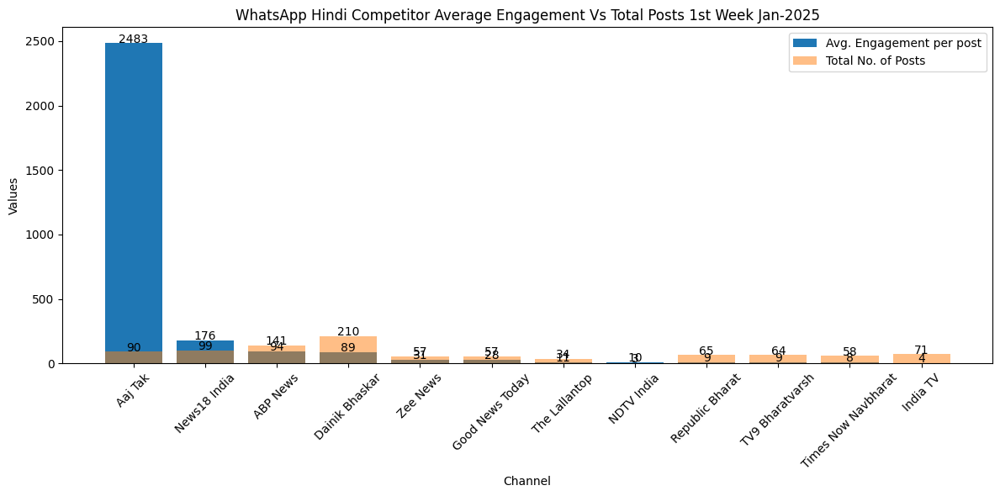

In [46]:
import pandas as pd
import matplotlib.pyplot as plt

# Sample DataFrame
# data = {
#     'Channel': ['Aaj Tak', 'News 18 India', 'ABP News', 'Dainik Bhaskar Hindi News', 'ZEE News', 'Republic Bharat', 'Times Now Navbharat', 'TV9 Bharatvarsh', 'Good News Today', 'NDTV India', 'India TV'],
#     'Avg. Engagement per post': [1190.44, 815.70, 454.69, 291.71, 39.17, 19.46, 18.00, 8.08, 7.24, 6.36, 5.54],
#     'Total No. of Posts': [210, 244, 260, 203, 399, 204, 64, 49, 98, 57, 478]
# }

df = result_df

# Set the figure size
plt.figure(figsize=(12, 6))

# Create the bar plots
bars1 = plt.bar(df['Channel'], df['Avg. Engagement per post'], label='Avg. Engagement per post')
bars2 = plt.bar(df['Channel'], df['Total No. of Posts'], label='Total No. of Posts', alpha=0.5)

# Add values inside the bars horizontally
for bar1, bar2 in zip(bars1, bars2):
    plt.text(bar1.get_x() + bar1.get_width() / 2, bar1.get_height() + 5, int(bar1.get_height()), fontsize=10, ha='center')
    plt.text(bar2.get_x() + bar2.get_width() / 2, bar2.get_height() + 5, int(bar2.get_height()), fontsize=10, ha='center')

# Add labels and title
plt.xlabel('Channel')
plt.xticks(rotation=45)
plt.ylabel('Values')
plt.title('WhatsApp Hindi Competitor Average Engagement Vs Total Posts 1st Week Jan-2025')

# Add a legend
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()


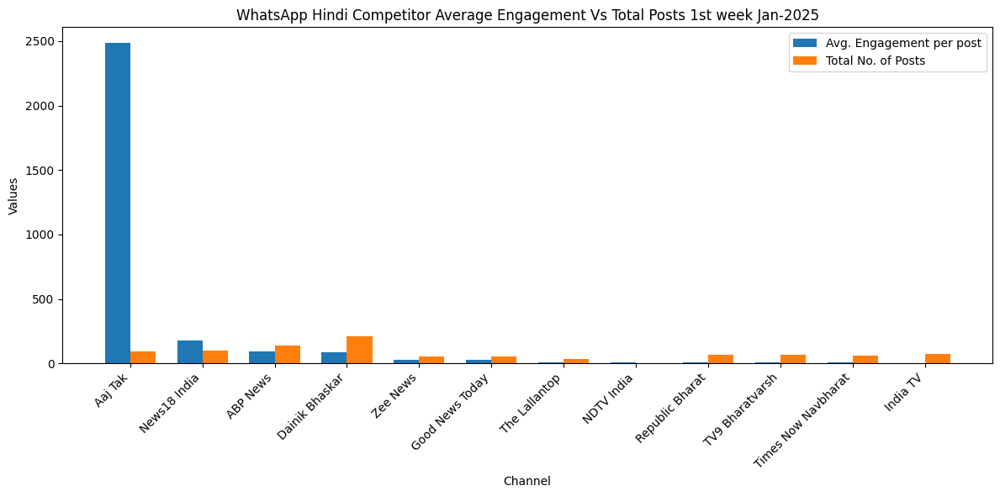

In [47]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Sample DataFrame
# data = {
#     'Channel': ['Aaj Tak', 'News 18 India', 'ABP News', 'Dainik Bhaskar Hindi News', 'ZEE News', 'Republic Bharat', 'Times Now Navbharat', 'TV9 Bharatvarsh', 'Good News Today', 'NDTV India', 'India TV'],
#     'Avg. Engagement per post': [1190.44, 815.70, 454.69, 291.71, 39.17, 19.46, 18.00, 8.08, 7.24, 6.36, 5.54],
#     'Total No. of Posts': [210, 244, 260, 203, 399, 204, 64, 49, 98, 57, 478]
# }

df = result_df

# Set the figure size
plt.figure(figsize=(12, 6))

# Create an array for the x-axis positions
x = np.arange(len(df['Channel']))

# Set the width of each bar
bar_width = 0.35

# Create the bar plots side-by-side
plt.bar(x - bar_width/2, df['Avg. Engagement per post'], bar_width, label='Avg. Engagement per post')
plt.bar(x + bar_width/2, df['Total No. of Posts'], bar_width, label='Total No. of Posts')

# Add x-axis labels
plt.xticks(x, df['Channel'], rotation=45, ha="right")

# Add labels and title
plt.xlabel('Channel')
plt.ylabel('Values')
plt.title('WhatsApp Hindi Competitor Average Engagement Vs Total Posts 1st week Jan-2025')

# Add a legend
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()


In [48]:
result_df.Channel.unique()

array(['Aaj Tak', 'News18 India', 'ABP News', 'Dainik Bhaskar',
       'Zee News', 'Good News Today', 'The Lallantop', 'NDTV India',
       'Republic Bharat', 'TV9 Bharatvarsh', 'Times Now Navbharat',
       'India TV'], dtype=object)

In [49]:
result_df = result_df[~(result_df['Channel']=='TImes Now Navbharat')]


In [50]:
result_df.Channel.unique()

array(['Aaj Tak', 'News18 India', 'ABP News', 'Dainik Bhaskar',
       'Zee News', 'Good News Today', 'The Lallantop', 'NDTV India',
       'Republic Bharat', 'TV9 Bharatvarsh', 'Times Now Navbharat',
       'India TV'], dtype=object)

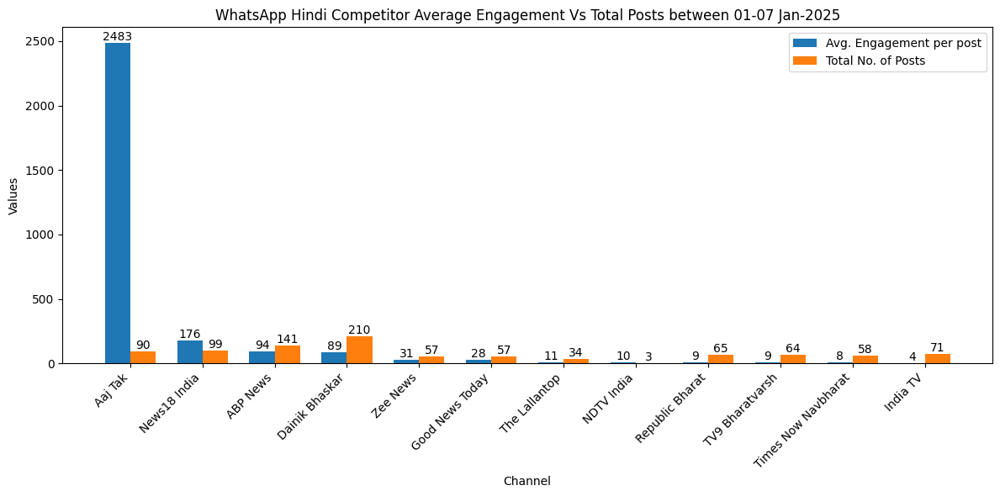

In [52]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# # Sample DataFrame
# data = {
#     'Channel': ['Aaj Tak', 'News 18 India', 'ABP News', 'Dainik Bhaskar Hindi News', 'ZEE News', 'Republic Bharat', 'Times Now Navbharat', 'TV9 Bharatvarsh', 'Good News Today', 'NDTV India', 'India TV'],
#     'Avg. Engagement per post': [1190.44, 815.70, 454.69, 291.71, 39.17, 19.46, 18.00, 8.08, 7.24, 6.36, 5.54],
#     'Total No. of Posts': [210, 244, 260, 203, 399, 204, 64, 49, 98, 57, 478]
# }

df = result_df

# Set the figure size
plt.figure(figsize=(12, 6))

# Create an array for the x-axis positions
x = np.arange(len(df['Channel']))

# Set the width of each bar
bar_width = 0.35

# Create the bar plots side-by-side
bars1 = plt.bar(x - bar_width/2, df['Avg. Engagement per post'], bar_width, label='Avg. Engagement per post')
bars2 = plt.bar(x + bar_width/2, df['Total No. of Posts'], bar_width, label='Total No. of Posts')

# Add values inside the bars
for bar1, bar2 in zip(bars1, bars2):
    plt.text(bar1.get_x() + bar1.get_width()/2, bar1.get_height(), str(int(bar1.get_height())), ha='center', va='bottom')
    plt.text(bar2.get_x() + bar2.get_width()/2, bar2.get_height(), str(int(bar2.get_height())), ha='center', va='bottom')

# Add x-axis labels
plt.xticks(x, df['Channel'], rotation=45, ha='right')

# Add labels and title
plt.xlabel('Channel')
plt.ylabel('Values')
plt.title('WhatsApp Hindi Competitor Average Engagement Vs Total Posts between 01-07 Jan-2025')

# Add a legend
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

              

In [53]:
df_hindi_comp.Date.unique()

array(['1/1/2025', '1/2/2025', '1/3/2025', '1/4/2025', '1/5/2025',
       '1/6/2025', '1/7/2025'], dtype=object)

In [54]:
df = pd.DataFrame(df_hindi_comp.groupby(["Channel"])["Engagement"].sum().sort_values().reset_index())
df

,Channel,Engagement
0,NDTV India,30
1,India TV,306
2,The Lallantop,393
3,Times Now Navbharat,495
4,TV9 Bharatvarsh,615
5,Republic Bharat,638
6,Good News Today,1639
7,Zee News,1772
8,ABP News,13278
9,News18 India,17473


Text(0, 0.5, 'Channel Names')

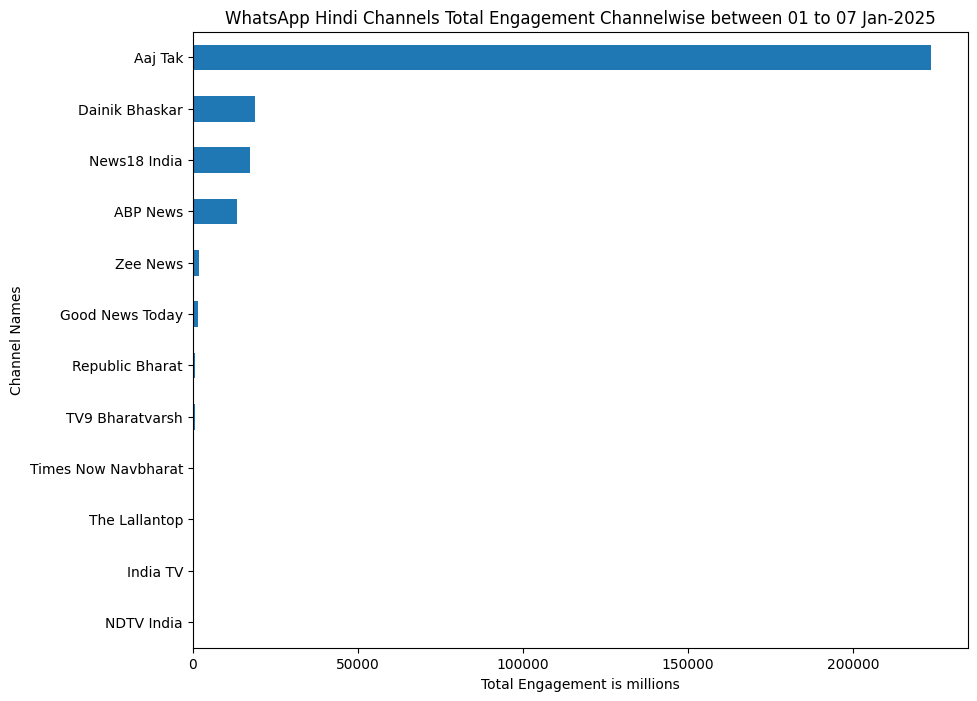

In [56]:
# df_hindi_comp["Channel"].value_counts().plot(kind="barh")
plt.figure(figsize=(10,8))
# Customize the plot
plt.title('WhatsApp Hindi Channels Total Engagement Channelwise between 01 to 07 Jan-2025')  # Set the figure title
# df_hindi_comp.groupby(["Category"],sort=True)["Engagement"].sum().sort_values().plot.barh()
df_hindi_comp.groupby(["Channel"])["Engagement"].sum().sort_values().plot(kind="barh")
plt.xlabel('Total Engagement is millions')  # Set the label for the X-axis
plt.ylabel('Channel Names')  # Set the label for the Y-axis

In [57]:
df = pd.DataFrame(df_hindi_comp.groupby(["Channel","Date","Category"])["Engagement"].sum().reset_index())
df

,Channel,Date,Category,Engagement
0,ABP News,1/1/2025,HEADLINES,1157
1,ABP News,1/1/2025,Horoscope,66
2,ABP News,1/1/2025,Political,393
3,ABP News,1/1/2025,VIRAL,279
4,ABP News,1/2/2025,CRIME,140
...,...,...,...,...
354,Zee News,1/6/2025,VIRAL,23
355,Zee News,1/7/2025,ELECTION,23
356,Zee News,1/7/2025,HEADLINES,112
357,Zee News,1/7/2025,Political,22


In [58]:
df = pd.DataFrame(df_hindi_comp.groupby(["Channel","Category"])["Engagement"].sum().reset_index())
df

,Channel,Category,Engagement
0,ABP News,Business,84
1,ABP News,CRIME,430
2,ABP News,EDUCATION,112
3,ABP News,HEADLINES,7974
4,ABP News,Horoscope,442
...,...,...,...
101,Zee News,International,180
102,Zee News,Political,249
103,Zee News,Sports,197
104,Zee News,TRENDING,81


In [59]:
df_hindi_comp.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Date,949,7,1/2/2025,148,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Time,949,573,07:00,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Channel,949,12,Dainik Bhaskar,210,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Stories,949,947,लड़की को साउंड बॉक्स में बंदकर कीलें...\nउन्नाव...,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
url,920,869,http://tinyurl.com/2s45c7aa,19,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Category,949,19,HEADLINES,392,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Engagement,949.0,NaN,NaN,NaN,293.88725,847.909441,0.0,12.0,55.0,114.0,7730.0


In [60]:
df_hindi_comp["Channel"].value_counts()

Channel
Dainik Bhaskar         210
ABP News               141
News18 India            99
Aaj Tak                 90
India TV                71
Republic Bharat         65
TV9 Bharatvarsh         64
Times Now Navbharat     58
Good News Today         57
Zee News                57
The Lallantop           34
NDTV India               3
Name: count, dtype: int64

In [61]:
df

,Channel,Category,Engagement
0,ABP News,Business,84
1,ABP News,CRIME,430
2,ABP News,EDUCATION,112
3,ABP News,HEADLINES,7974
4,ABP News,Horoscope,442
...,...,...,...
101,Zee News,International,180
102,Zee News,Political,249
103,Zee News,Sports,197
104,Zee News,TRENDING,81


Text(0, 0.5, 'Channel Names')

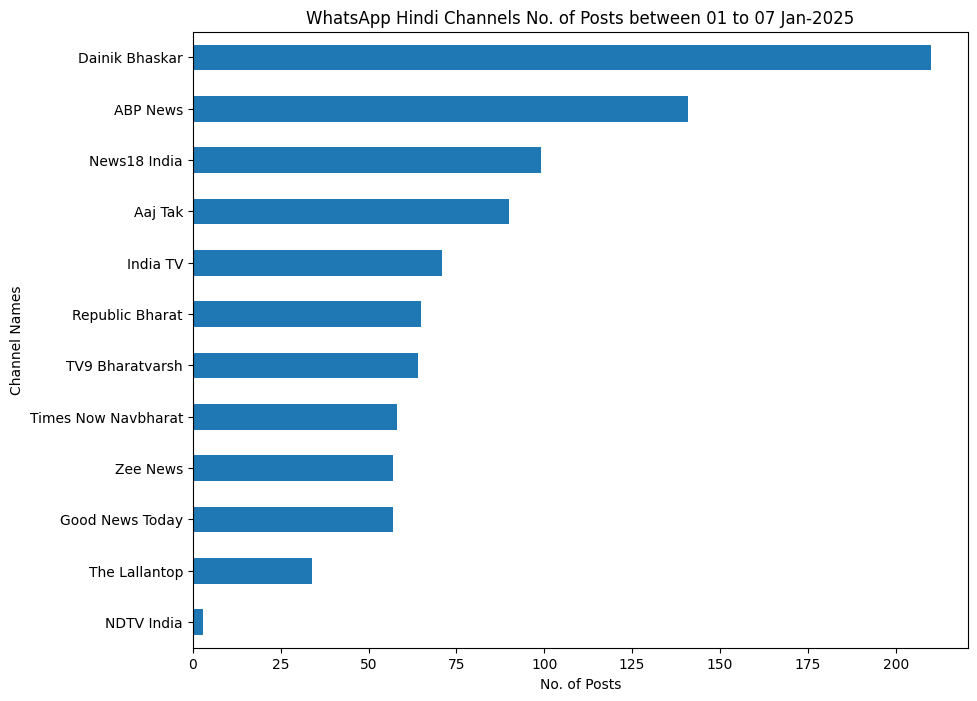

In [63]:
# df_hindi_comp["Channel"].value_counts().plot(kind="barh")
plt.figure(figsize=(10,8))
# Customize the plot
plt.title('WhatsApp Hindi Channels No. of Posts between 01 to 07 Jan-2025')  # Set the figure title
# df_hindi_comp.groupby(["Category"],sort=True)["Engagement"].sum().sort_values().plot.barh()
df_hindi_comp["Channel"].value_counts().sort_values().plot(kind="barh")
plt.xlabel('No. of Posts')  # Set the label for the X-axis
plt.ylabel('Channel Names')  # Set the label for the Y-axis

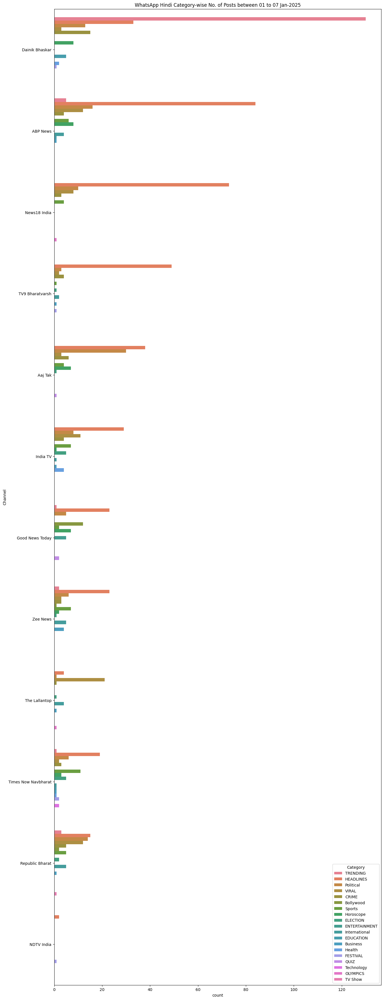

In [65]:
# importing packages 
import seaborn as sns



# perform groupby 
df = df_hindi_comp.groupby('Category').Channel.value_counts().sort_values(ascending=False)
df = df.reset_index() 

# for channel in df_hindi_comp.Channel.unique():

    # setting the dimensions of the plot
fig, ax = plt.subplots(figsize=(15, 45))

# plot barplot 
sns.barplot(x="count", 
           y="Channel", 
           hue="Category", 
           ax=ax,
           data=df)
plt.title('WhatsApp Hindi Category-wise No. of Posts between 01 to 07 Jan-2025')  # Set the figure title
plt.show()

In [66]:
df

,Category,Channel,count
0,TRENDING,Dainik Bhaskar,130
1,HEADLINES,ABP News,84
2,HEADLINES,News18 India,73
3,HEADLINES,TV9 Bharatvarsh,49
4,HEADLINES,Aaj Tak,38
...,...,...,...
101,QUIZ,Aaj Tak,1
102,Sports,TV9 Bharatvarsh,1
103,TV Show,Republic Bharat,1
104,TRENDING,Good News Today,1


In [67]:
# df_hindi_comp["Channel"].value_counts().plot(kind="barh")
plt.figure(figsize=(150,150))
# Customize the plot
plt.title('WhatsApp Hindi Channels No. of Posts between 01 to 07 Jan-2025')  # Set the figure title
# df_hindi_comp.groupby(["Category"],sort=True)["Engagement"].sum().sort_values().plot.barh()
df_hindi_comp.groupby('Category').Channel.value_counts().sort_values().plot.bar()
# df_hindi_comp["Channel"].value_counts().sort_values().plot(kind="barh")
plt.xlabel('No. of Posts')  # Set the label for the X-axis
plt.ylabel('Channel Names')  # Set the label for the Y-axi

Text(0, 0.5, 'Channel Names')

In [68]:
plt.figure(figsize=(10,10))
df = df_hindi_comp.reindex(sorted(df_hindi_comp.columns)[::-1], axis=1)
# df_hindi_comp["Category"].unique().tolist()
df["Category"].unique().tolist()

['HEADLINES',
 'Horoscope',
 'Political',
 'Sports',
 'CRIME',
 'VIRAL',
 'QUIZ',
 'ELECTION',
 'TRENDING',
 'International',
 'EDUCATION',
 'Business',
 'Bollywood',
 'ENTERTAINMENT',
 'Health',
 'FESTIVAL',
 'OLYMPICS',
 'TV Show',
 'Technology']

<Figure size 1000x1000 with 0 Axes>

In [69]:
# df

In [127]:
# duplicates = df_hindi_comp[df_hindi_comp.duplicated(subset=['Category'], keep=False)]

In [128]:
# duplicates

In [70]:
# df = df_hindi_comp.groupby(["Channel","Category"],sort=True)["Engagement"].sum()
df = df_hindi_comp.groupby(["Category"],sort=True)["Engagement"].sum().sort_values(ascending=False)
df

Category
HEADLINES        126257
Political         88973
CRIME             20493
TRENDING          12492
Sports            11370
VIRAL              5163
QUIZ               4897
ELECTION           4108
Horoscope          2815
International       721
Bollywood           541
EDUCATION           328
Business            217
Health              149
FESTIVAL            143
OLYMPICS            111
ENTERTAINMENT        88
Technology           17
TV Show              16
Name: Engagement, dtype: int64

Text(0, 0.5, 'Category/Topics')

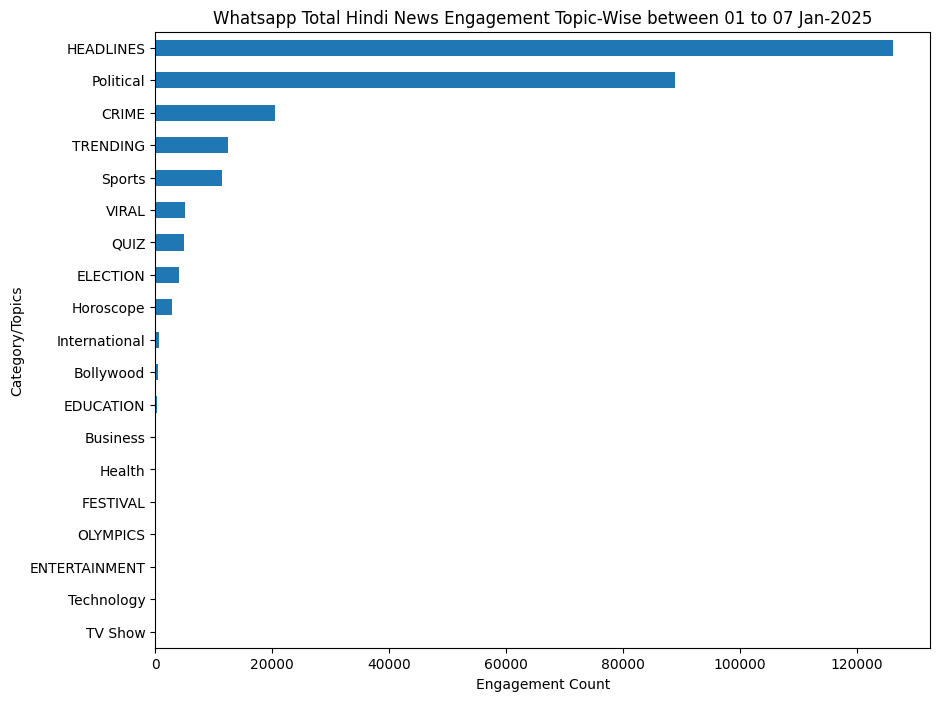

In [72]:
plt.figure(figsize=(10,8))
# Customize the plot
plt.title('Whatsapp Total Hindi News Engagement Topic-Wise between 01 to 07 Jan-2025')  # Set the figure title
df_hindi_comp.groupby(["Category"],sort=True)["Engagement"].sum().sort_values().plot.barh()
plt.xlabel('Engagement Count')  # Set the label for the X-axis
plt.ylabel('Category/Topics')  # Set the label for the Y-axis

Text(0, 0.5, 'Category/Topics')

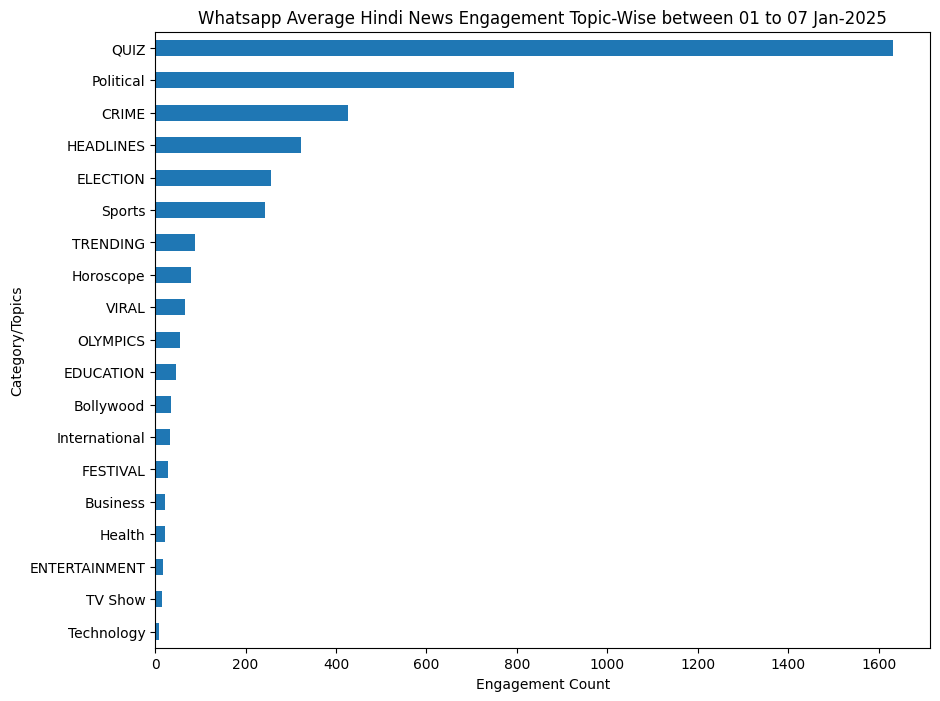

In [74]:
plt.figure(figsize=(10,8))
# Customize the plot
plt.title('Whatsapp Average Hindi News Engagement Topic-Wise between 01 to 07 Jan-2025')  # Set the figure title
df_hindi_comp.groupby(["Category"],sort=True)["Engagement"].mean().sort_values().plot.barh()
plt.xlabel('Engagement Count')  # Set the label for the X-axis
plt.ylabel('Category/Topics')  # Set the label for the Y-axis

<Axes: xlabel='Category'>

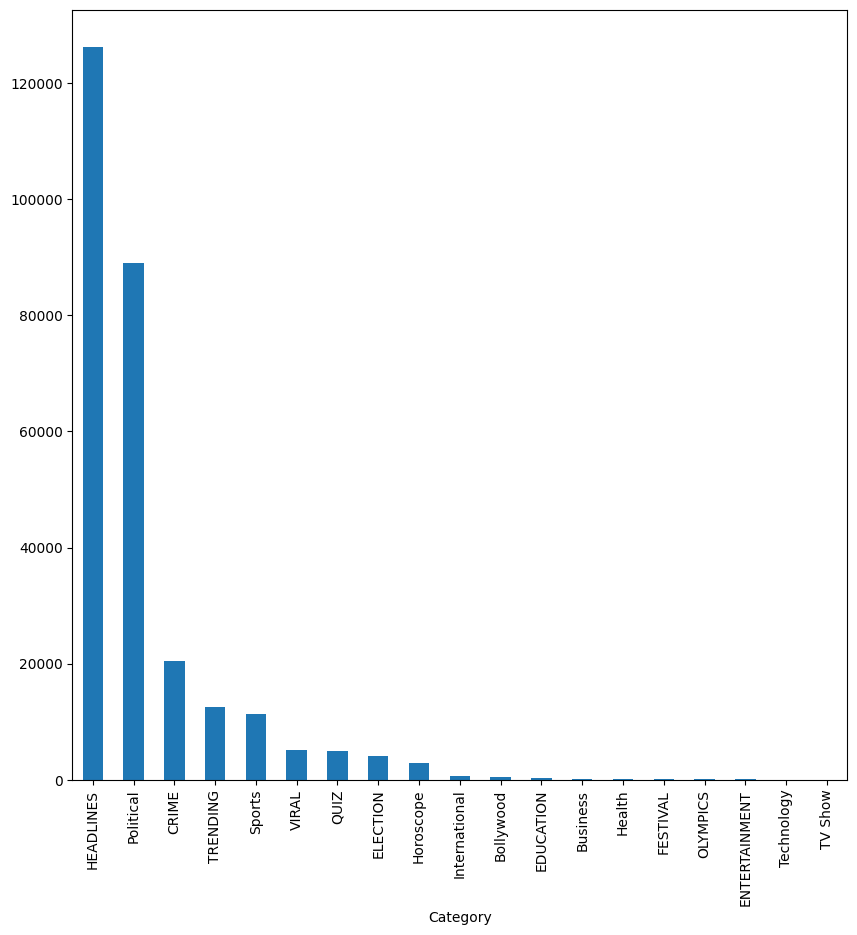

In [75]:
plt.figure(figsize=(10,10))
# sns.barplot(data=df.T.sort_values(ascending=False))
df.T.sort_values(ascending=False).plot(kind="bar")

In [76]:
df_avg_engagement_category = pd.DataFrame(df_hindi_comp.groupby(["Channel","Category"])["Engagement"].mean().sort_values(ascending=False).reset_index())
df_avg_engagement_category.rename(columns={'Engagement': 'Avg. Engagement per post'}, inplace=True)
df_avg_engagement_category

,Channel,Category,Avg. Engagement per post
0,Aaj Tak,QUIZ,4797.000000
1,Aaj Tak,ELECTION,3981.000000
2,Aaj Tak,CRIME,3039.666667
3,Aaj Tak,Political,2770.300000
4,Aaj Tak,HEADLINES,2669.421053
...,...,...,...
101,The Lallantop,Business,2.000000
102,India TV,Sports,1.857143
103,Times Now Navbharat,Horoscope,1.333333
104,India TV,Business,0.000000


In [77]:
df_total_posts_category = pd.DataFrame(df_hindi_comp.groupby(["Channel","Category"])["Stories"].count().sort_values(ascending=False).reset_index())
df_total_posts_category.rename(columns={'Stories': 'Total No. of Posts'}, inplace=True)
df_total_posts_category

,Channel,Category,Total No. of Posts
0,Dainik Bhaskar,TRENDING,130
1,ABP News,HEADLINES,84
2,News18 India,HEADLINES,73
3,TV9 Bharatvarsh,HEADLINES,49
4,Aaj Tak,HEADLINES,38
...,...,...,...
101,The Lallantop,ELECTION,1
102,The Lallantop,CRIME,1
103,Times Now Navbharat,TRENDING,1
104,Zee News,Bollywood,1


In [78]:
result_df = pd.merge(df_avg_engagement_category, df_total_posts_category, on=["Channel","Category"], how='left')
# result_df = pd.merge(result_df, df_diff, on=["DATE"], how='left')
# result_df
result_df = result_df.sort_values(by='Avg. Engagement per post',ascending=False)
result_df.dropna(inplace=True)
result_df

,Channel,Category,Avg. Engagement per post,Total No. of Posts
0,Aaj Tak,QUIZ,4797.000000,1
1,Aaj Tak,ELECTION,3981.000000,1
2,Aaj Tak,CRIME,3039.666667,6
3,Aaj Tak,Political,2770.300000,30
4,Aaj Tak,HEADLINES,2669.421053,38
...,...,...,...,...
101,The Lallantop,Business,2.000000,1
102,India TV,Sports,1.857143,7
103,Times Now Navbharat,Horoscope,1.333333,3
104,India TV,Business,0.000000,1


In [79]:
df_avg_engagement_category.Channel.unique()

array(['Aaj Tak', 'News18 India', 'Dainik Bhaskar', 'ABP News',
       'Good News Today', 'Zee News', 'TV9 Bharatvarsh', 'The Lallantop',
       'Times Now Navbharat', 'NDTV India', 'Republic Bharat', 'India TV'],
      dtype=object)

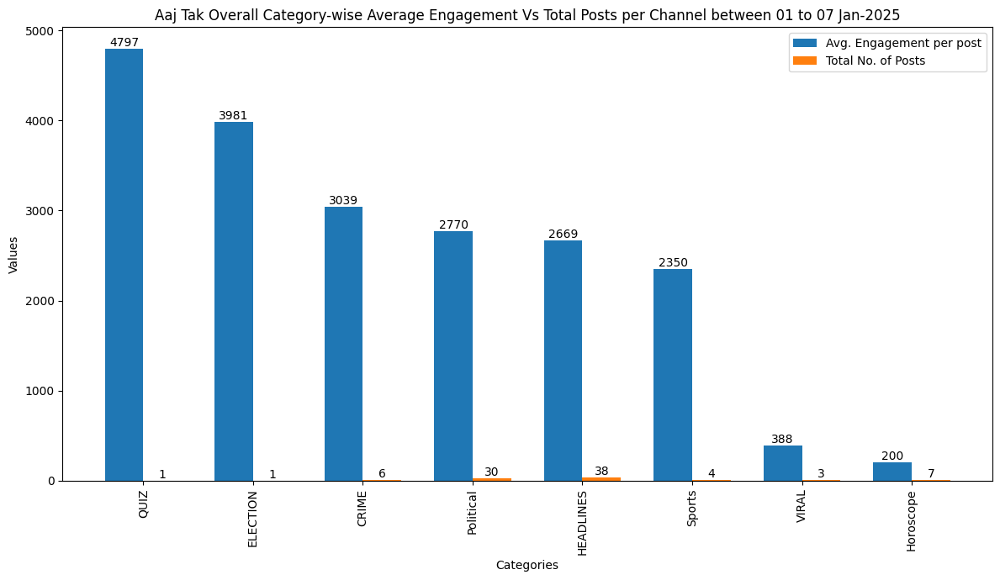

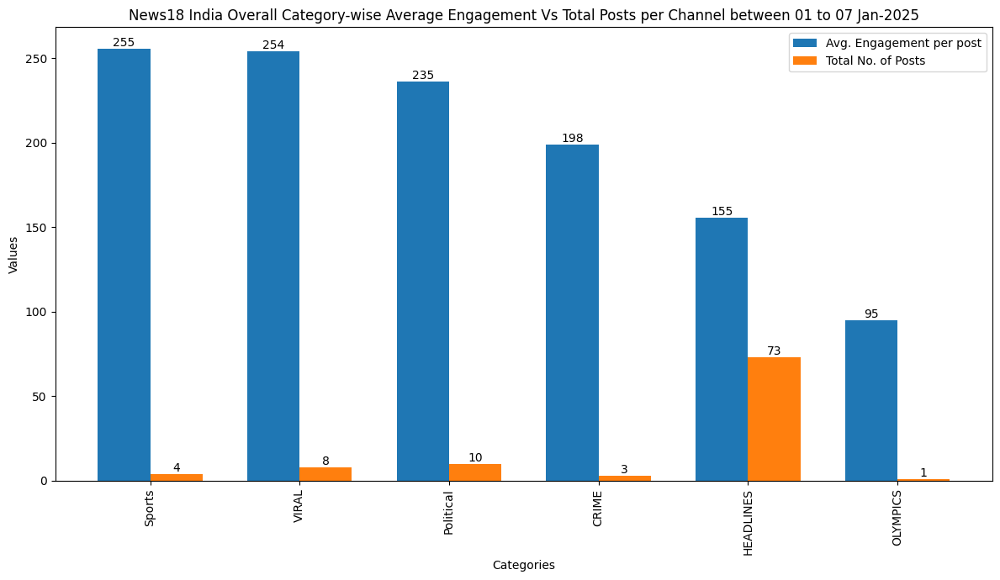

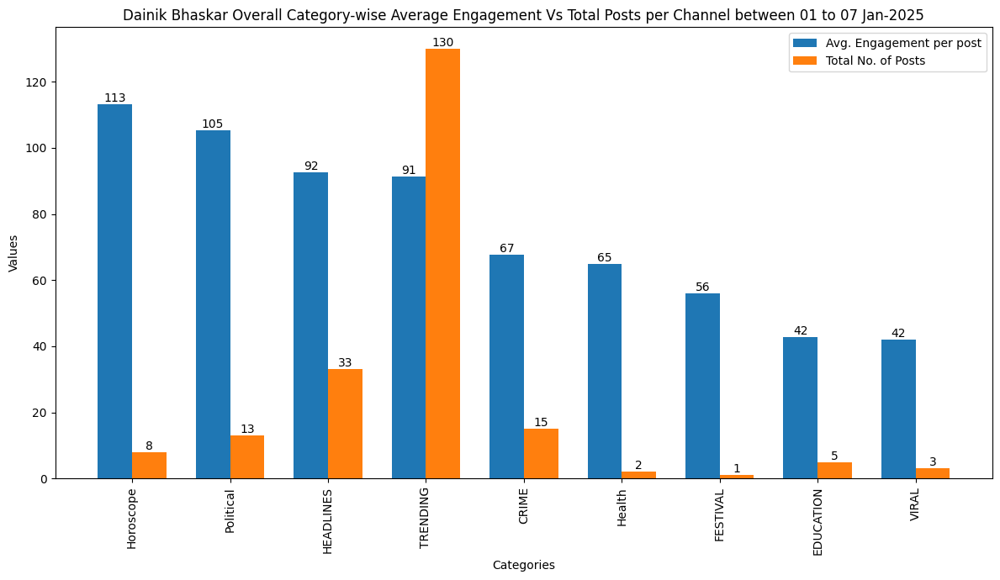

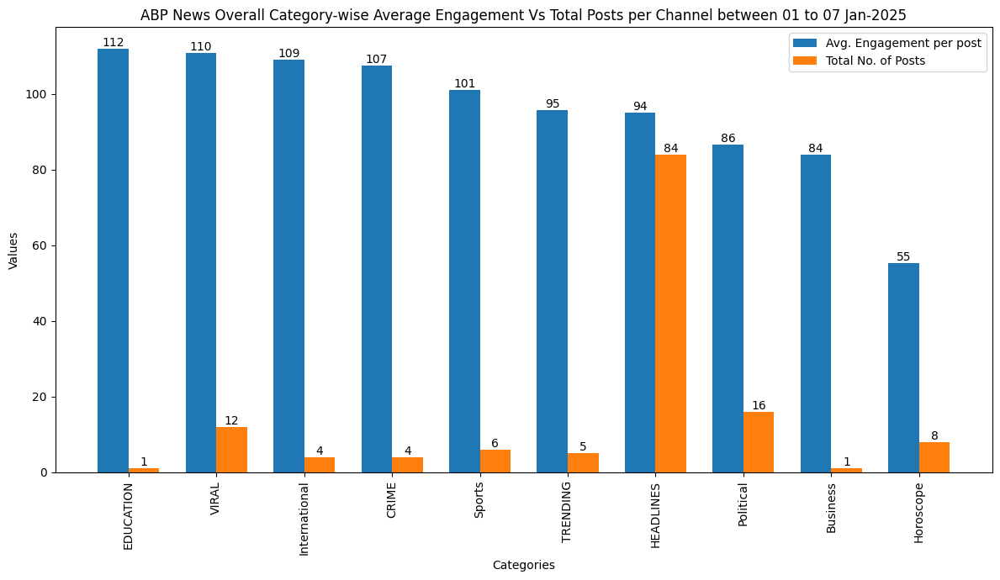

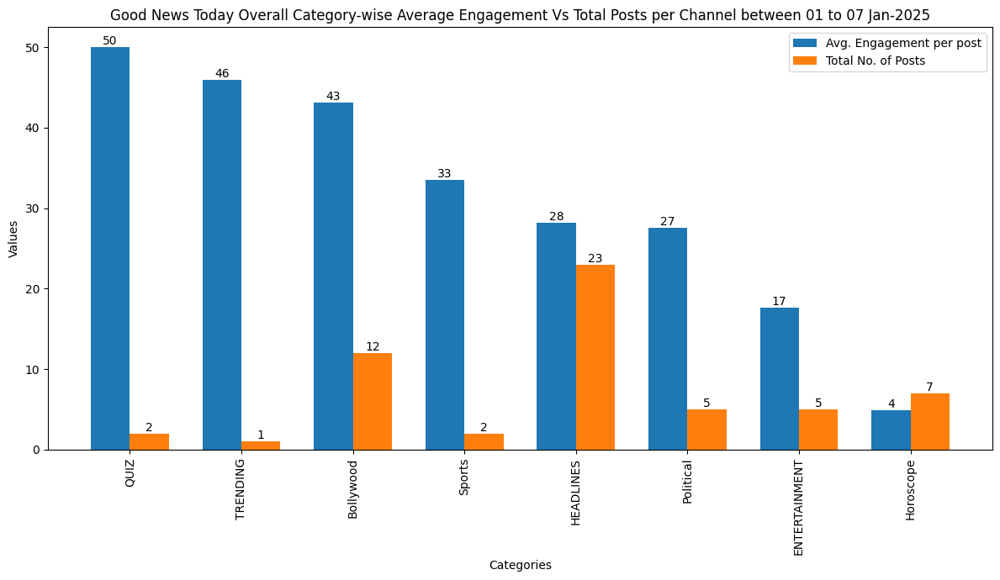

...

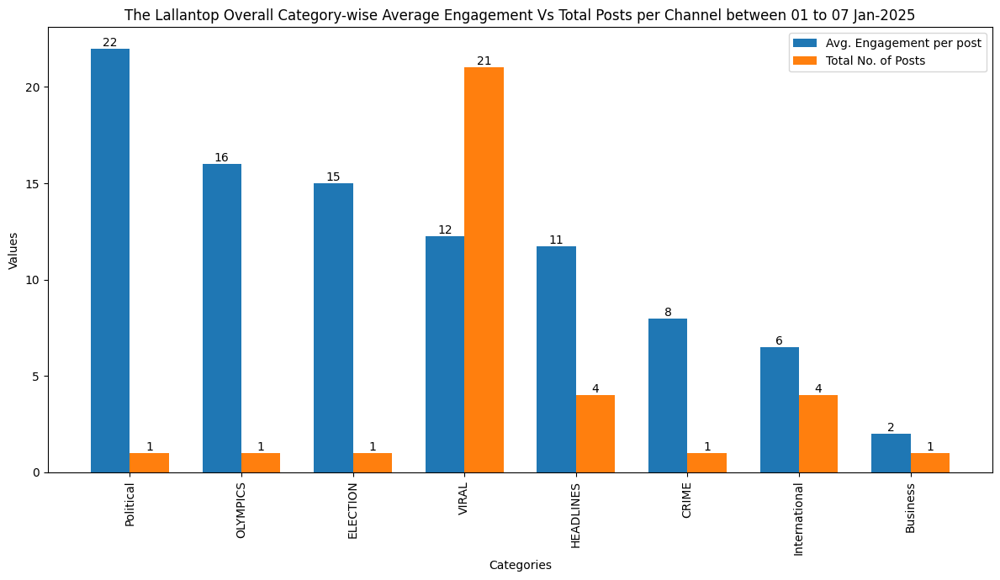

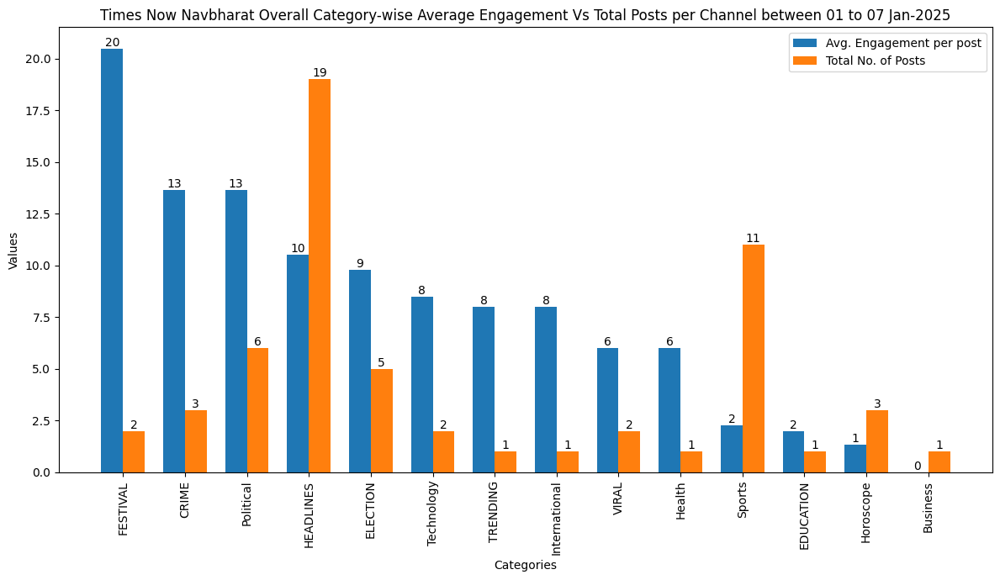

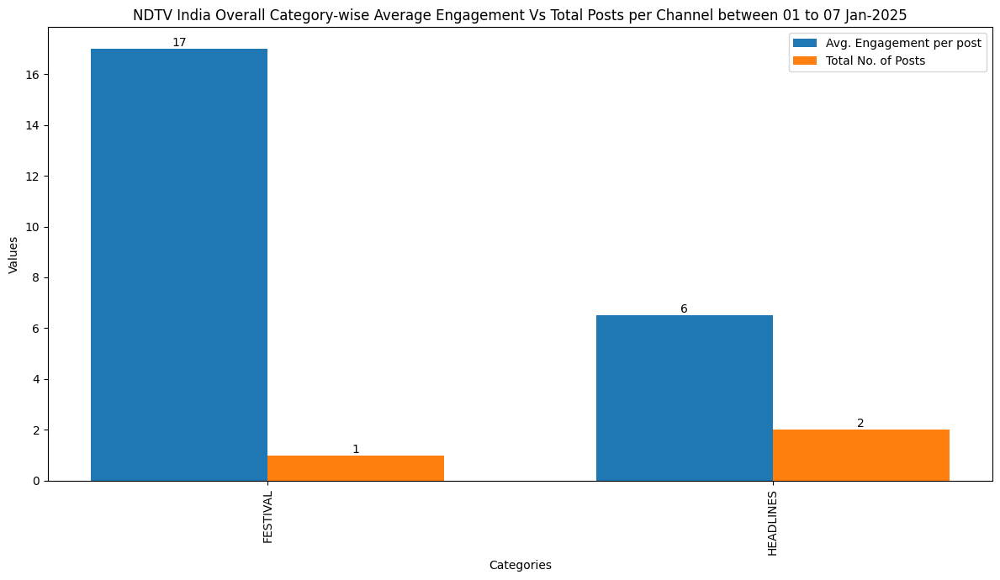

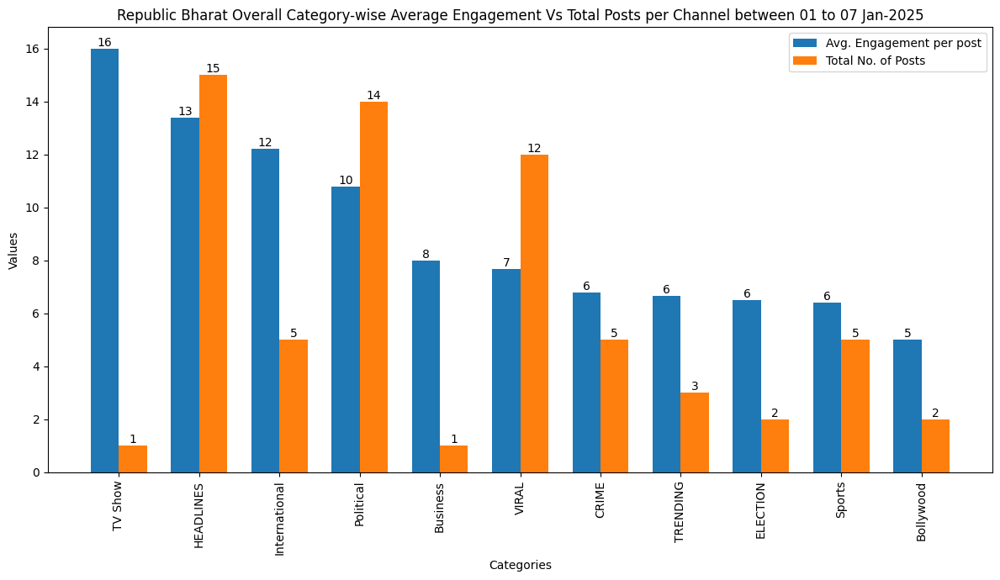

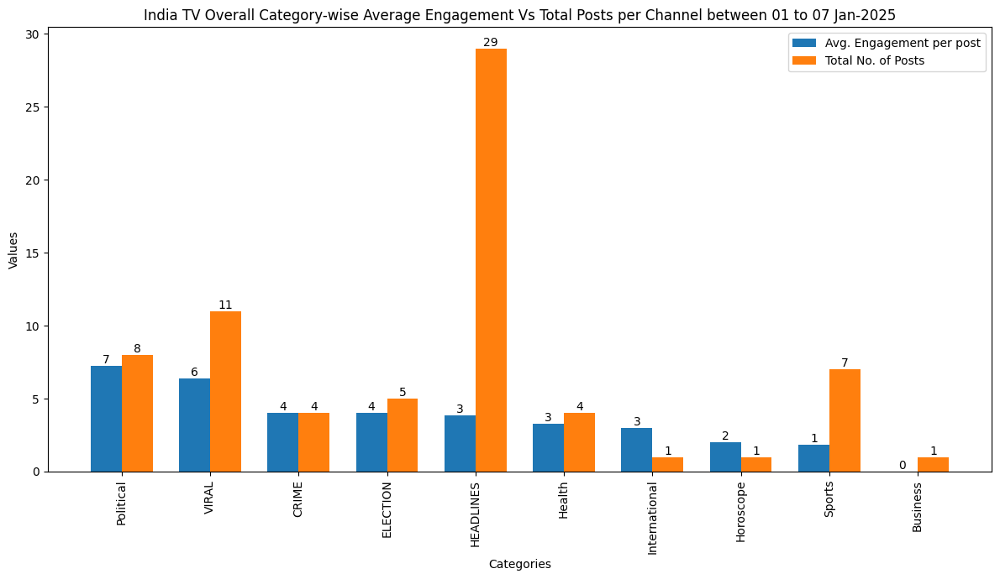

In [81]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# # Create a DataFrame with the data
# data = {
#     'Channel': ['Aaj Tak', 'News 18 India', 'ABP News', 'Dainik Bhaskar Hindi News', 'ZEE News', 'Republic Bharat', 'Times Now Navbharat', 'TV9 Bharatvarsh', 'Good News Today', 'NDTV India', 'India TV'],
#     'Avg. Engagement per post': [1190.44, 815.70, 454.69, 291.71, 39.17, 19.46, 18.00, 8.08, 7.24, 6.36, 5.54],
#     'Total No. of Posts': [210, 244, 260, 203, 399, 204, 64, 49, 98, 57, 478]
# }

for channel in result_df.Channel.unique():
    df_channel = result_df[result_df["Channel"] == channel]
    df = df_channel

    # Set the figure size
    plt.figure(figsize=(12, 7))

    # Create an array for the x-axis positions
    x = np.arange(len(df['Category']))

    # Set the width of each bar
    bar_width = 0.35
    
    # Create the bar plots side-by-side
    bars1 = plt.bar(x - bar_width/2, df['Avg. Engagement per post'], bar_width, label='Avg. Engagement per post')
    bars2 = plt.bar(x + bar_width/2, df['Total No. of Posts'], bar_width, label='Total No. of Posts')

    # Add values inside the bars
    for bar1, bar2 in zip(bars1, bars2):
        plt.text(bar1.get_x() + bar1.get_width()/2, bar1.get_height(), str(int(bar1.get_height())), ha='center', va='bottom')
        plt.text(bar2.get_x() + bar2.get_width()/2, bar2.get_height(), str(int(bar2.get_height())), ha='center', va='bottom')

#     # Create the bar plots side-by-side
#     plt.bar(x - bar_width/2, df['Avg. Engagement per post'], bar_width, label='Avg. Engagement per post')
#     plt.bar(x + bar_width/2, df['Total No. of Posts'], bar_width, label='Total No. of Posts')

    # Add labels and title
    plt.xlabel("Categories")
    plt.xticks(x, df['Category'], rotation=90)
    plt.ylabel('Values')
    plt.title(f'{channel} Overall Category-wise Average Engagement Vs Total Posts per Channel between 01 to 07 Jan-2025')

    # Add a legend
    plt.legend()

    # Show the plot
    plt.tight_layout()
    plt.show()

In [82]:
df_total_engagement_category = pd.DataFrame(df_hindi_comp.groupby(["Channel","Category"])["Engagement"].sum().sort_values(ascending=False).reset_index())
df_total_engagement_category.rename(columns={'Stories': 'Total Engagement per Category'}, inplace=True)
df_total_engagement_category

,Channel,Category,Engagement
0,Aaj Tak,HEADLINES,101438
1,Aaj Tak,Political,83109
2,Aaj Tak,CRIME,18238
3,Dainik Bhaskar,TRENDING,11859
4,News18 India,HEADLINES,11369
...,...,...,...
101,India TV,Horoscope,2
102,Times Now Navbharat,EDUCATION,2
103,The Lallantop,Business,2
104,India TV,Business,0


In [139]:
# result_df = pd.merge(df_avg_engagement_category, df_total_posts_category, on=["Channel","Category"], how='left')
# # result_df = pd.merge(result_df, df_diff, on=["DATE"], how='left')
# # result_df
# result_df = result_df.sort_values(by='Total Engagement per Category',ascending=False)
# result_df.dropna(inplace=True)
# result_df

In [83]:
result_df.to_csv("CategorywiseAvgEngagement_Hndi_07012024.csv")

In [84]:
df_total_engagement_category

,Channel,Category,Engagement
0,Aaj Tak,HEADLINES,101438
1,Aaj Tak,Political,83109
2,Aaj Tak,CRIME,18238
3,Dainik Bhaskar,TRENDING,11859
4,News18 India,HEADLINES,11369
...,...,...,...
101,India TV,Horoscope,2
102,Times Now Navbharat,EDUCATION,2
103,The Lallantop,Business,2
104,India TV,Business,0


In [85]:
df_total_posts_category

,Channel,Category,Total No. of Posts
0,Dainik Bhaskar,TRENDING,130
1,ABP News,HEADLINES,84
2,News18 India,HEADLINES,73
3,TV9 Bharatvarsh,HEADLINES,49
4,Aaj Tak,HEADLINES,38
...,...,...,...
101,The Lallantop,ELECTION,1
102,The Lallantop,CRIME,1
103,Times Now Navbharat,TRENDING,1
104,Zee News,Bollywood,1


In [87]:
result_df

,Channel,Category,Avg. Engagement per post,Total No. of Posts
0,Aaj Tak,QUIZ,4797.000000,1
1,Aaj Tak,ELECTION,3981.000000,1
2,Aaj Tak,CRIME,3039.666667,6
3,Aaj Tak,Political,2770.300000,30
4,Aaj Tak,HEADLINES,2669.421053,38
...,...,...,...,...
101,The Lallantop,Business,2.000000,1
102,India TV,Sports,1.857143,7
103,Times Now Navbharat,Horoscope,1.333333,3
104,India TV,Business,0.000000,1


In [88]:
result_df = pd.merge(df_total_engagement_category, df_total_posts_category, on=["Channel","Category"], how='left')
# result_df = pd.merge(result_df, df_diff, on=["DATE"], how='left')
# result_df
result_df = result_df.sort_values(by='Engagement',ascending=False)
result_df.dropna(inplace=True)
result_df

,Channel,Category,Engagement,Total No. of Posts
0,Aaj Tak,HEADLINES,101438,38
1,Aaj Tak,Political,83109,30
2,Aaj Tak,CRIME,18238,6
3,Dainik Bhaskar,TRENDING,11859,130
4,News18 India,HEADLINES,11369,73
...,...,...,...,...
101,India TV,Horoscope,2,1
102,Times Now Navbharat,EDUCATION,2,1
103,The Lallantop,Business,2,1
104,India TV,Business,0,1


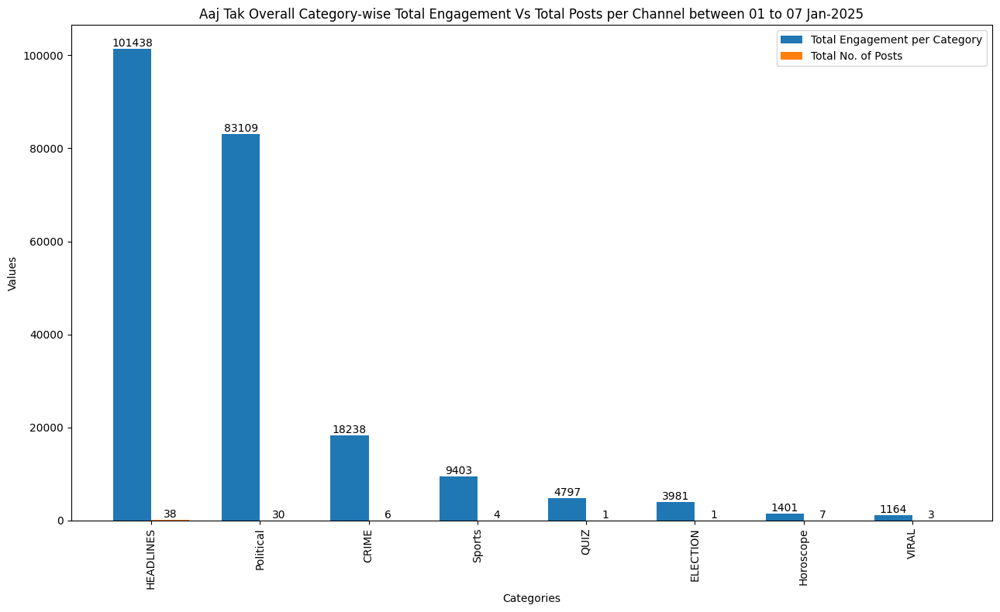

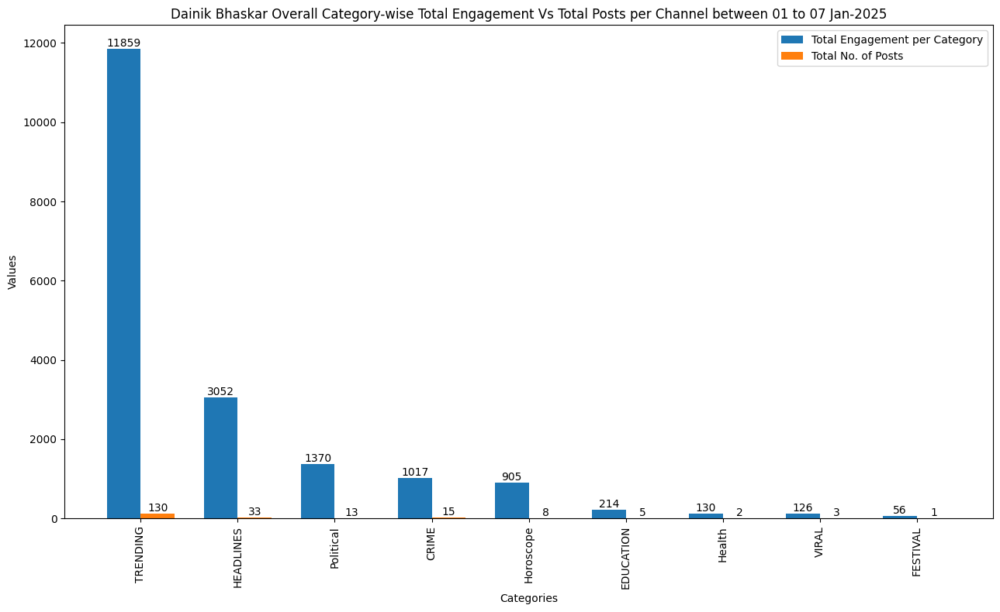

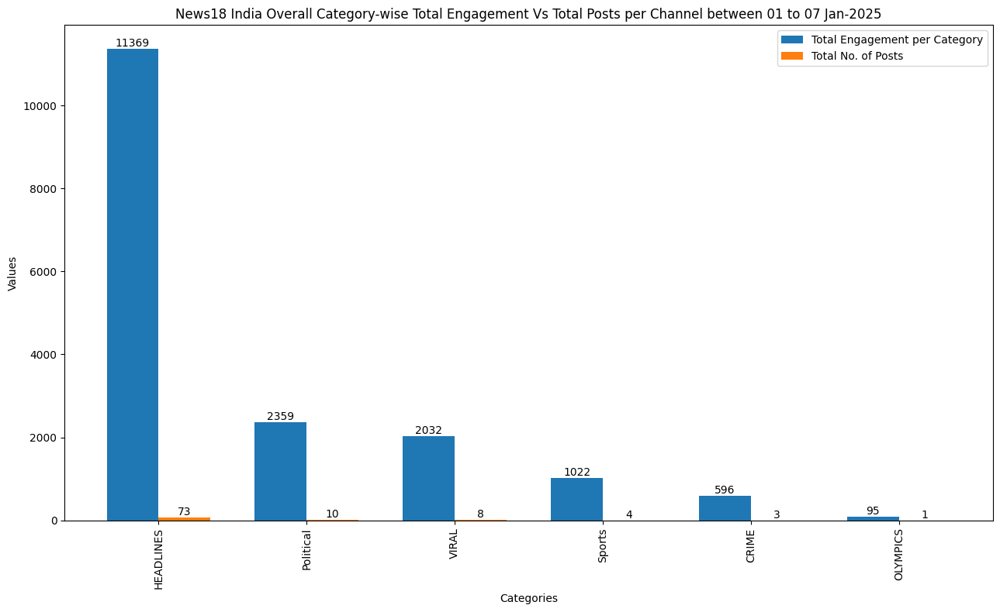

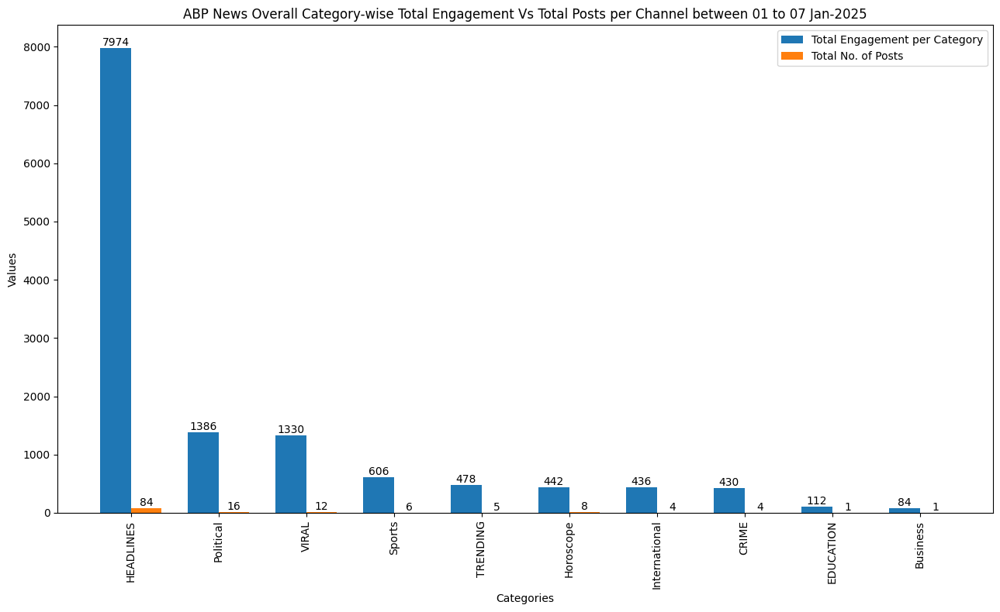

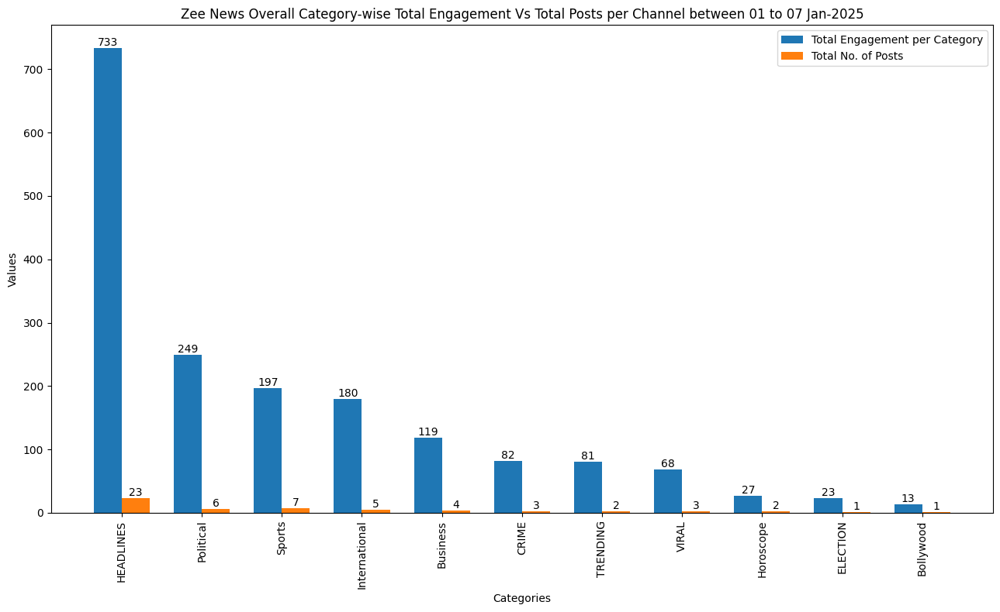

...

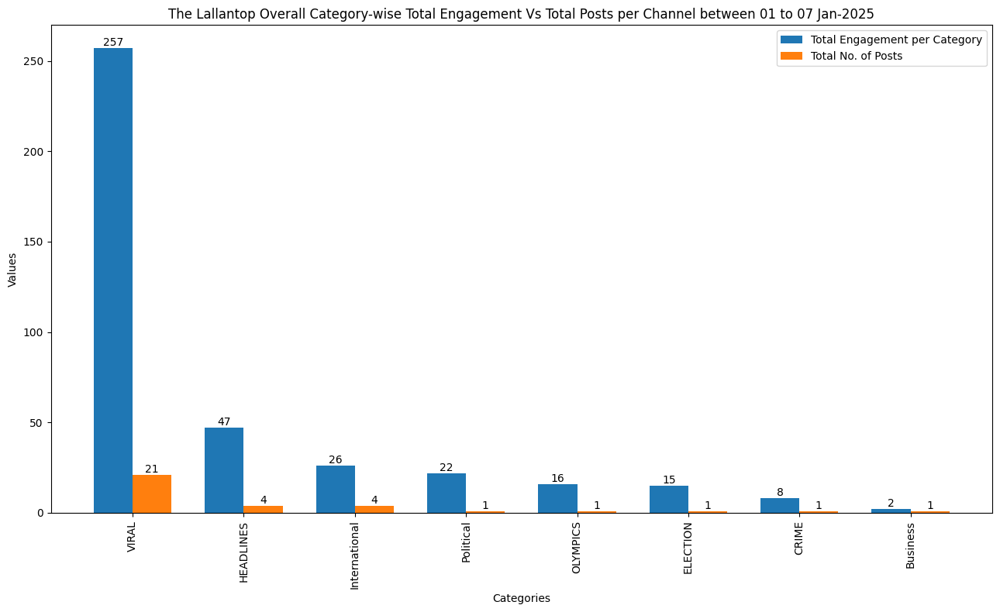

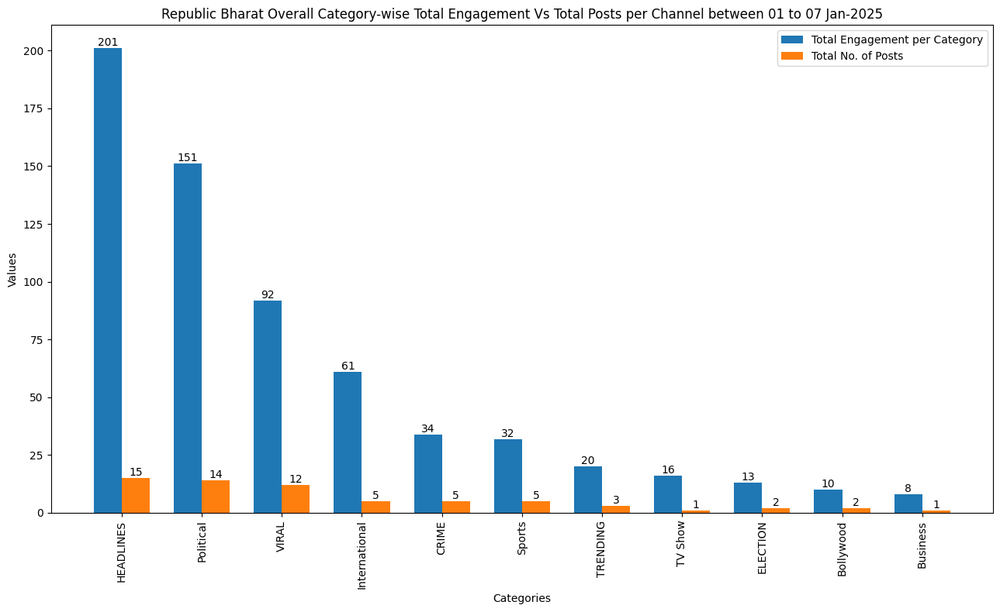

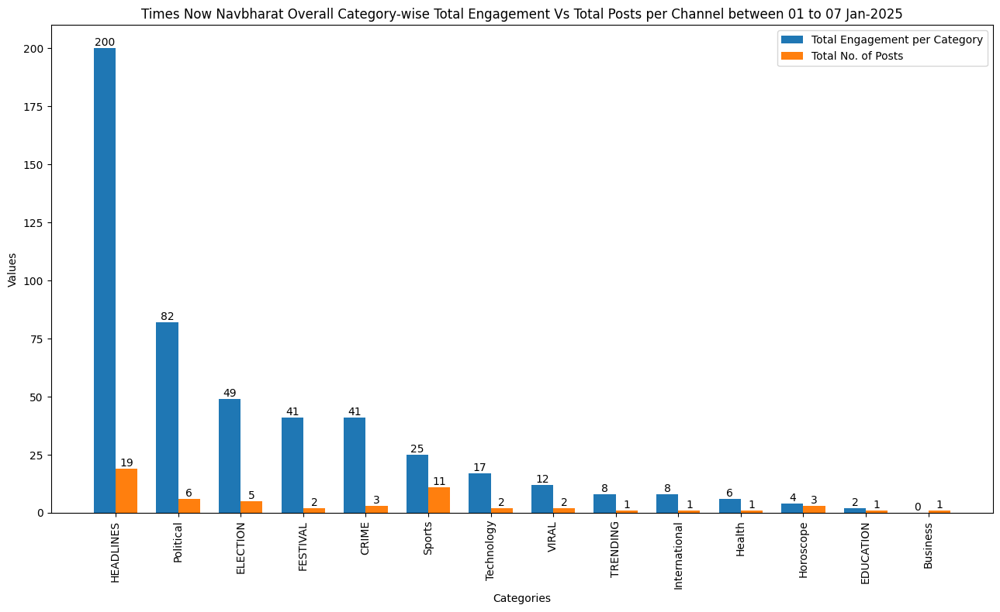

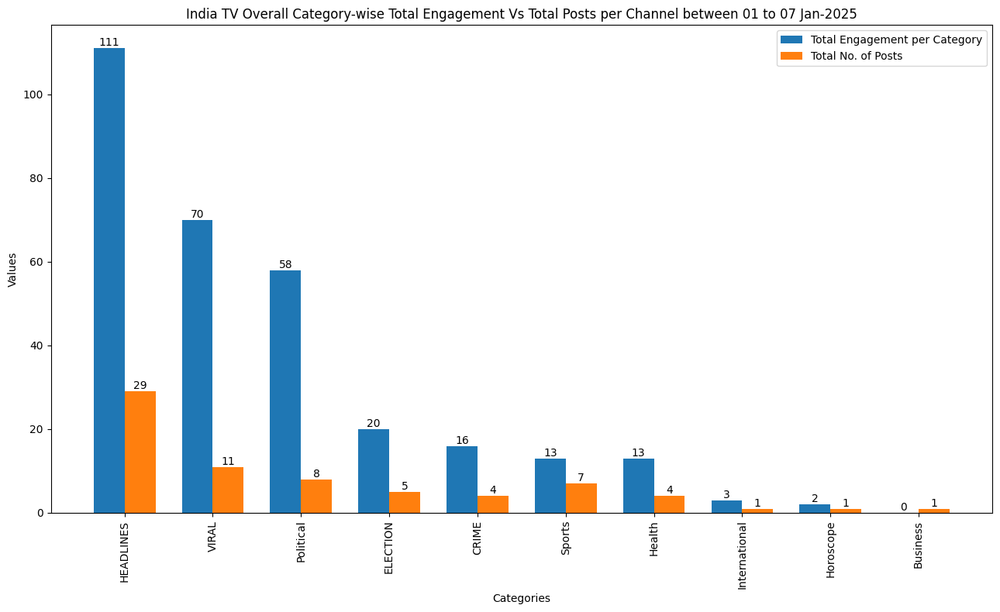

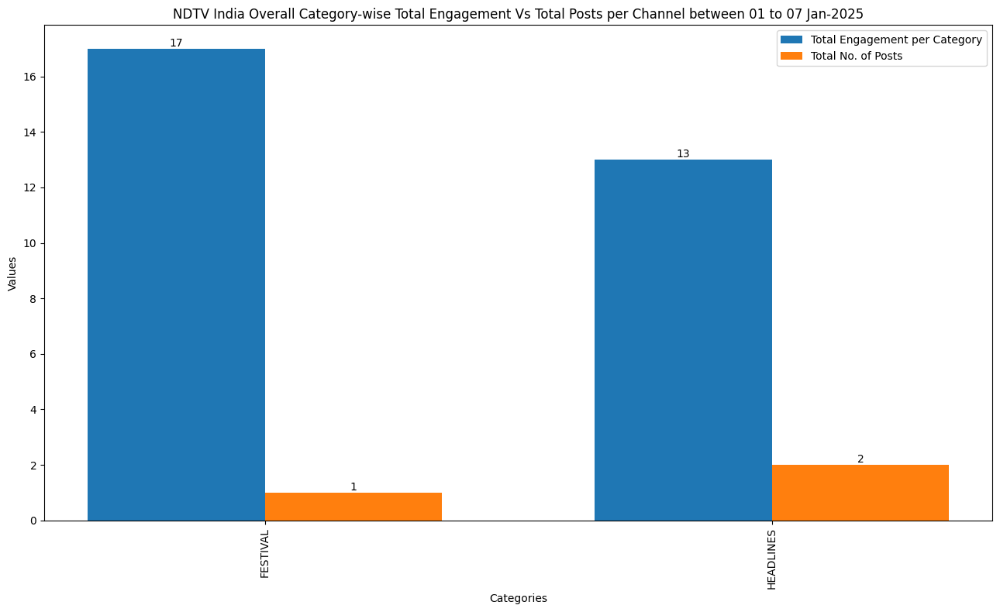

In [90]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# # Create a DataFrame with the data
# data = {
#     'Channel': ['Aaj Tak', 'News 18 India', 'ABP News', 'Dainik Bhaskar Hindi News', 'ZEE News', 'Republic Bharat', 'Times Now Navbharat', 'TV9 Bharatvarsh', 'Good News Today', 'NDTV India', 'India TV'],
#     'Avg. Engagement per post': [1190.44, 815.70, 454.69, 291.71, 39.17, 19.46, 18.00, 8.08, 7.24, 6.36, 5.54],
#     'Total No. of Posts': [210, 244, 260, 203, 399, 204, 64, 49, 98, 57, 478]
# }

for channel in result_df.Channel.unique():
    df_channel = result_df[result_df["Channel"] == channel]
    df = df_channel

    # Set the figure size
    plt.figure(figsize=(13, 8))

    # Create an array for the x-axis positions
    x = np.arange(len(df['Category']))

    # Set the width of each bar
    bar_width = 0.35
    
    # Create the bar plots side-by-side
    bars1 = plt.bar(x - bar_width/2, df['Engagement'], bar_width, label='Total Engagement per Category')
    bars2 = plt.bar(x + bar_width/2, df['Total No. of Posts'], bar_width, label='Total No. of Posts')

    # Add values inside the bars
    for bar1, bar2 in zip(bars1, bars2):
        plt.text(bar1.get_x() + bar1.get_width()/2, bar1.get_height(), str(int(bar1.get_height())), ha='center', va='bottom')
        plt.text(bar2.get_x() + bar2.get_width()/2, bar2.get_height(), str(int(bar2.get_height())), ha='center', va='bottom')

#     # Create the bar plots side-by-side
#     plt.bar(x - bar_width/2, df['Avg. Engagement per post'], bar_width, label='Avg. Engagement per post')
#     plt.bar(x + bar_width/2, df['Total No. of Posts'], bar_width, label='Total No. of Posts')

    # Add labels and title
    plt.xlabel("Categories")
    plt.xticks(x, df['Category'], rotation=90)
    plt.ylabel('Values')
    plt.title(f'{channel} Overall Category-wise Total Engagement Vs Total Posts per Channel between 01 to 07 Jan-2025')

    # Add a legend
    plt.legend()

    # Show the plot
    plt.tight_layout()
    plt.show()

C:\Users\nilotpal.kumar\AppData\Local\Temp\ipykernel_12612\10751717.py:2: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  top_5_posts_by_channel = df_hindi_comp.groupby('Channel').apply(
C:\Users\nilotpal.kumar\AppData\Local\Temp\ipykernel_12612\10751717.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["Channel_Caption"] = df["Category"] + " -> " + df["Stories"]
C:\Users\nilotpal.kumar\AppData\Local\Temp\ipykernel_12612\10751717.py:9: SettingWithCopyWar

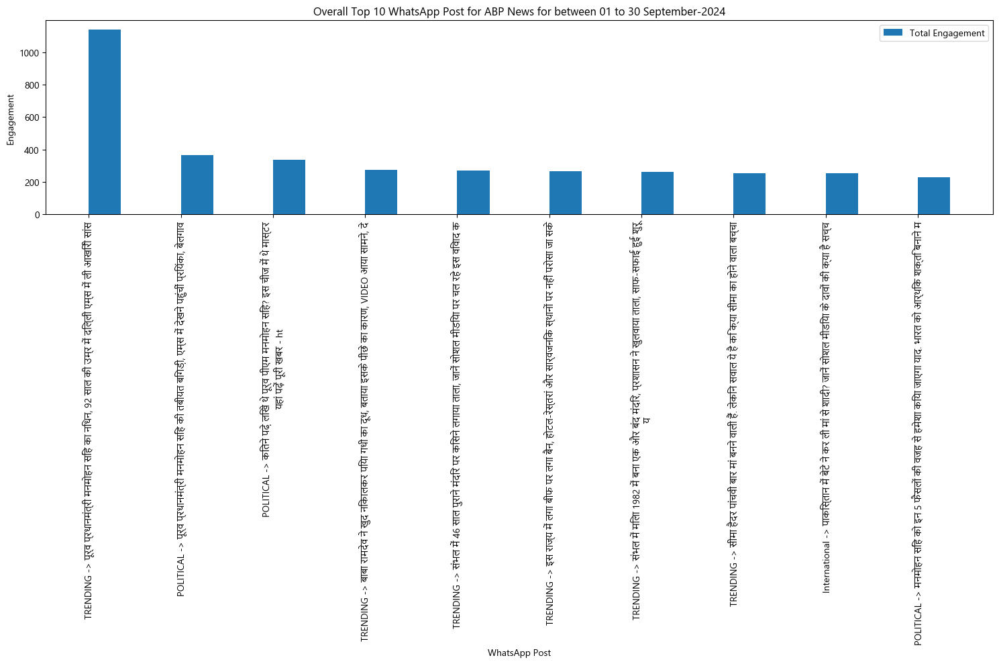

C:\Users\nilotpal.kumar\AppData\Local\Temp\ipykernel_12612\10751717.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["Channel_Caption"] = df["Category"] + " -> " + df["Stories"]
C:\Users\nilotpal.kumar\AppData\Local\Temp\ipykernel_12612\10751717.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["shrt_caption"] = df["Channel_Caption"].str.slice(0,100)


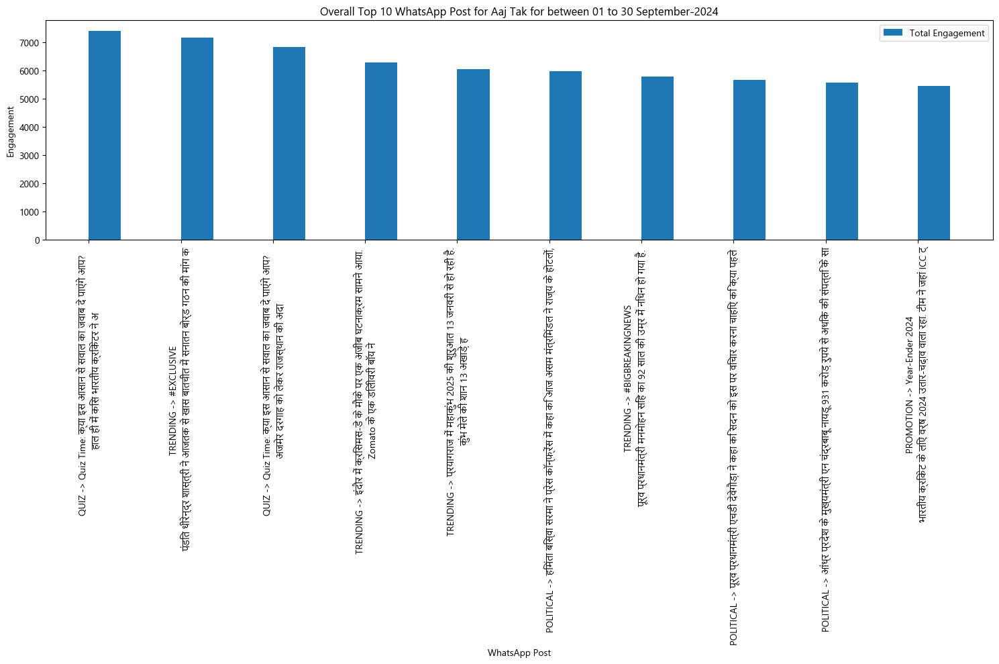

C:\Users\nilotpal.kumar\AppData\Local\Temp\ipykernel_12612\10751717.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["Channel_Caption"] = df["Category"] + " -> " + df["Stories"]
C:\Users\nilotpal.kumar\AppData\Local\Temp\ipykernel_12612\10751717.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["shrt_caption"] = df["Channel_Caption"].str.slice(0,100)


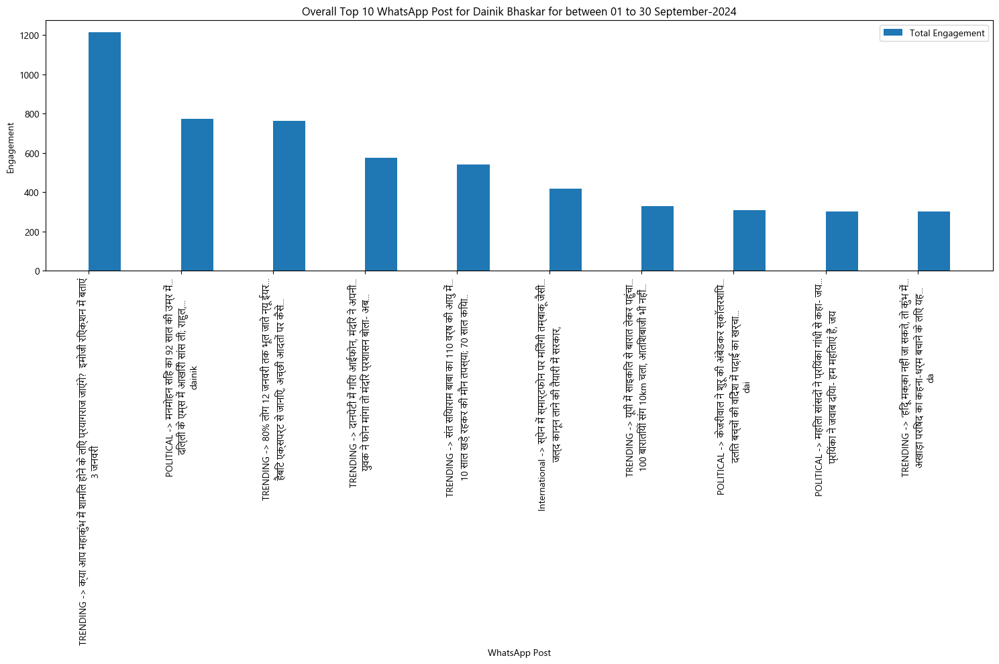

C:\Users\nilotpal.kumar\AppData\Local\Temp\ipykernel_12612\10751717.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["Channel_Caption"] = df["Category"] + " -> " + df["Stories"]
C:\Users\nilotpal.kumar\AppData\Local\Temp\ipykernel_12612\10751717.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["shrt_caption"] = df["Channel_Caption"].str.slice(0,100)


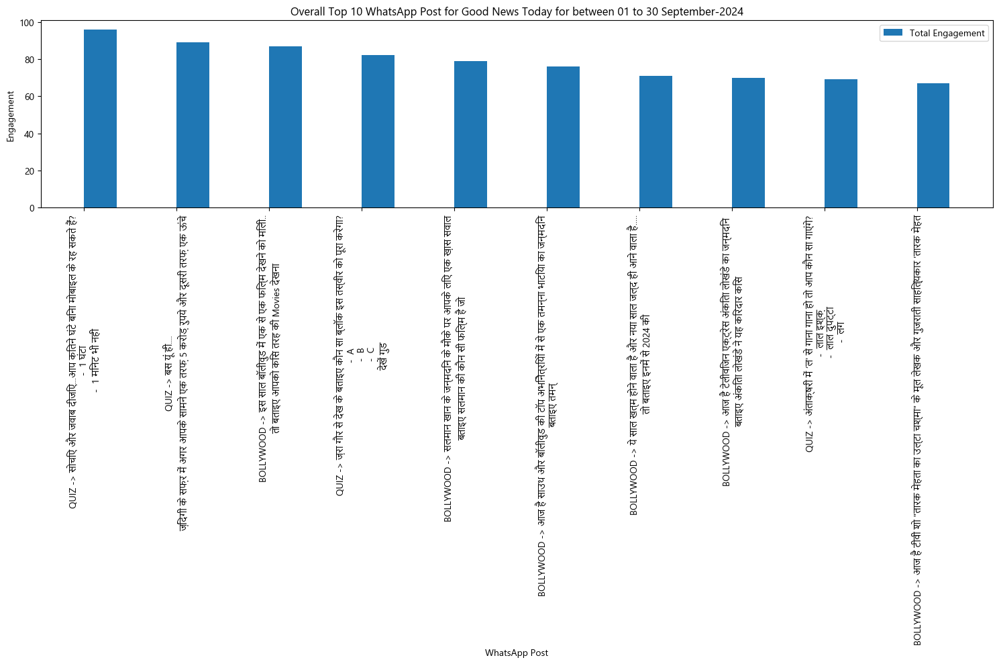

C:\Users\nilotpal.kumar\AppData\Local\Temp\ipykernel_12612\10751717.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["Channel_Caption"] = df["Category"] + " -> " + df["Stories"]
C:\Users\nilotpal.kumar\AppData\Local\Temp\ipykernel_12612\10751717.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["shrt_caption"] = df["Channel_Caption"].str.slice(0,100)


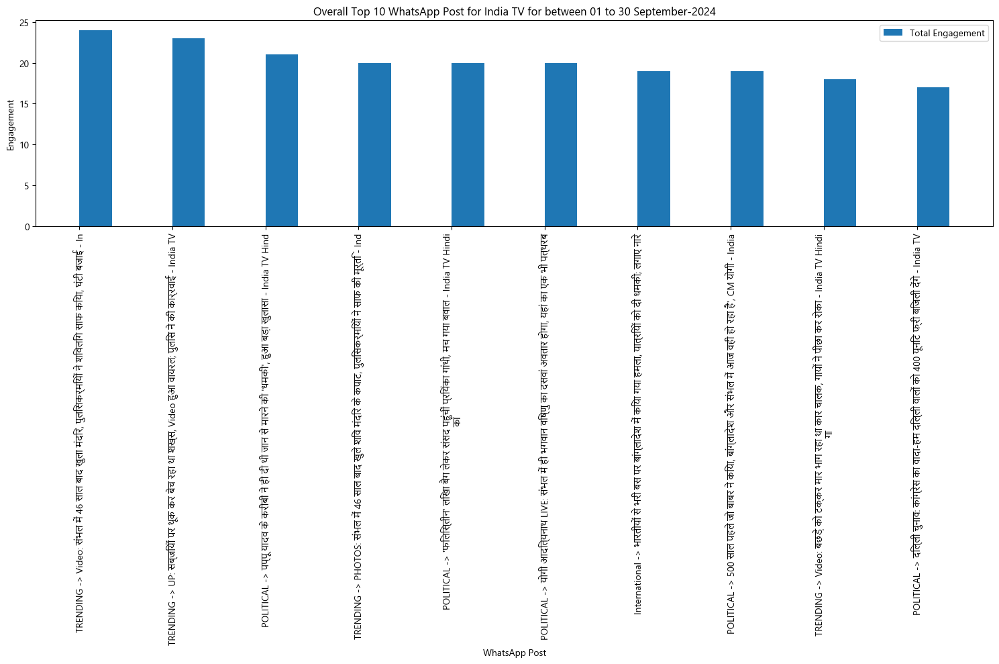

C:\Users\nilotpal.kumar\AppData\Local\Temp\ipykernel_12612\10751717.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["Channel_Caption"] = df["Category"] + " -> " + df["Stories"]
C:\Users\nilotpal.kumar\AppData\Local\Temp\ipykernel_12612\10751717.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["shrt_caption"] = df["Channel_Caption"].str.slice(0,100)


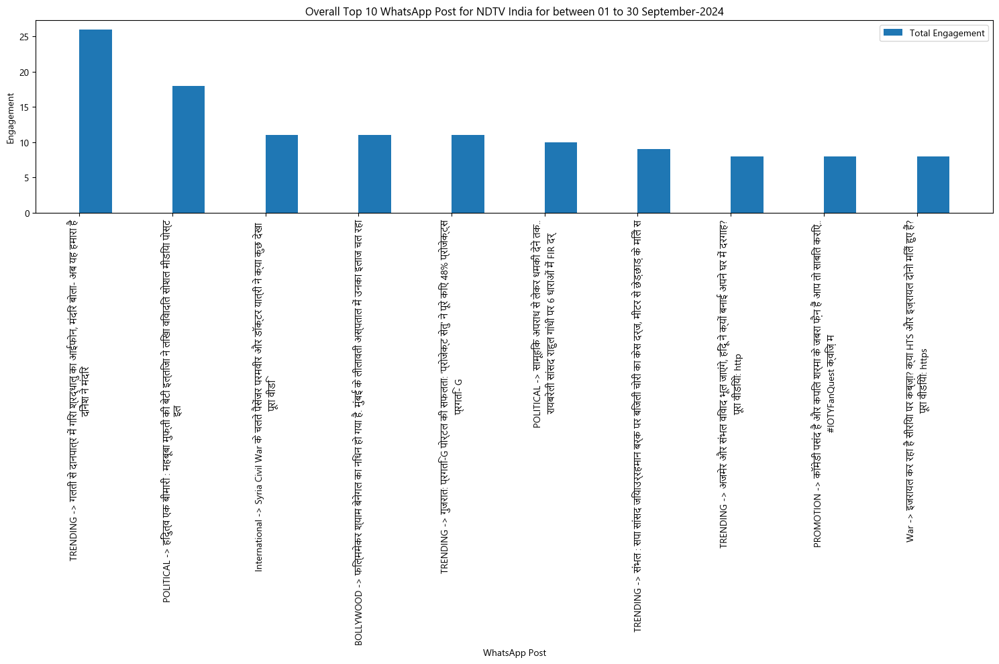

C:\Users\nilotpal.kumar\AppData\Local\Temp\ipykernel_12612\10751717.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["Channel_Caption"] = df["Category"] + " -> " + df["Stories"]
C:\Users\nilotpal.kumar\AppData\Local\Temp\ipykernel_12612\10751717.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["shrt_caption"] = df["Channel_Caption"].str.slice(0,100)


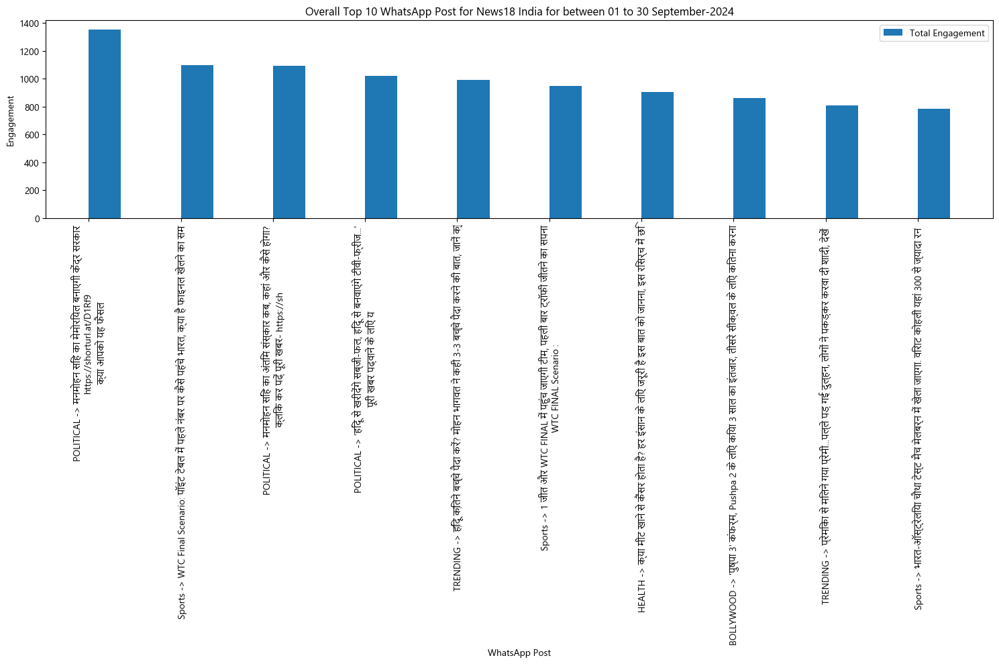

C:\Users\nilotpal.kumar\AppData\Local\Temp\ipykernel_12612\10751717.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["Channel_Caption"] = df["Category"] + " -> " + df["Stories"]
C:\Users\nilotpal.kumar\AppData\Local\Temp\ipykernel_12612\10751717.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["shrt_caption"] = df["Channel_Caption"].str.slice(0,100)


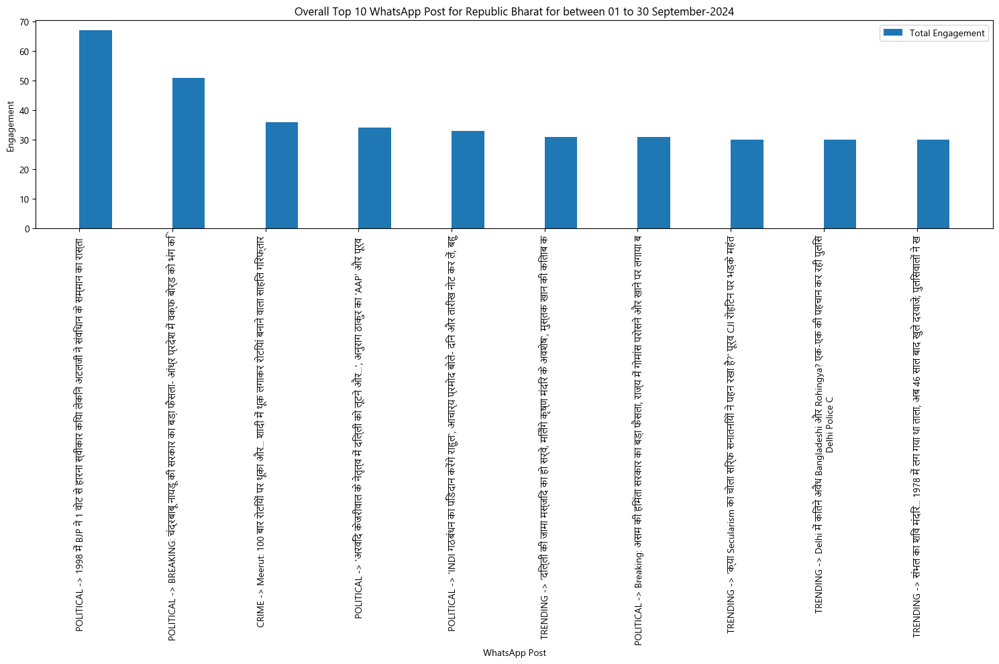

C:\Users\nilotpal.kumar\AppData\Local\Temp\ipykernel_12612\10751717.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["Channel_Caption"] = df["Category"] + " -> " + df["Stories"]
C:\Users\nilotpal.kumar\AppData\Local\Temp\ipykernel_12612\10751717.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["shrt_caption"] = df["Channel_Caption"].str.slice(0,100)


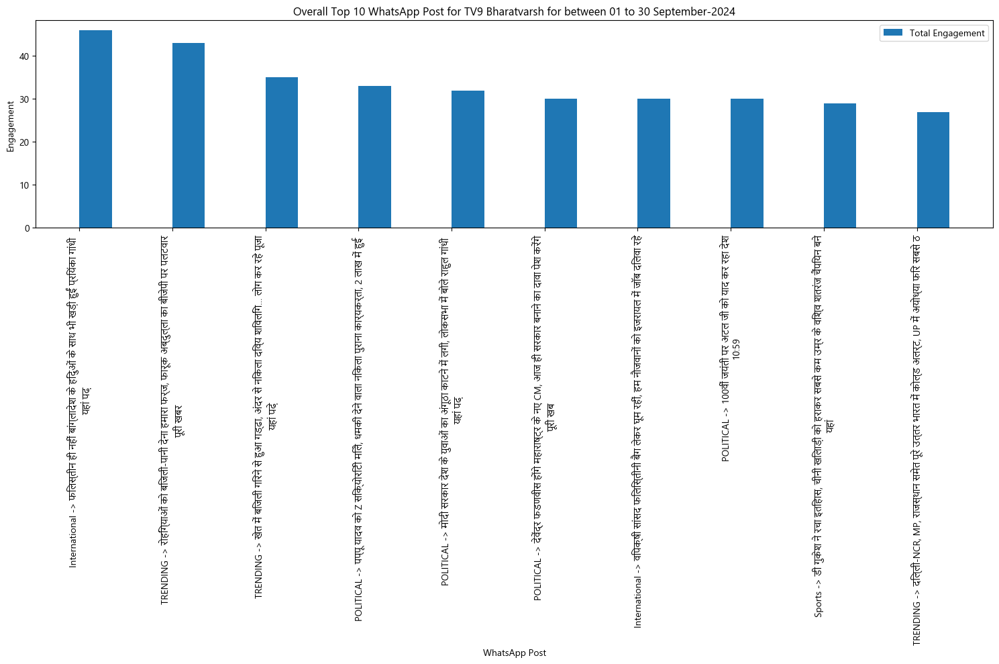

C:\Users\nilotpal.kumar\AppData\Local\Temp\ipykernel_12612\10751717.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["Channel_Caption"] = df["Category"] + " -> " + df["Stories"]
C:\Users\nilotpal.kumar\AppData\Local\Temp\ipykernel_12612\10751717.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["shrt_caption"] = df["Channel_Caption"].str.slice(0,100)


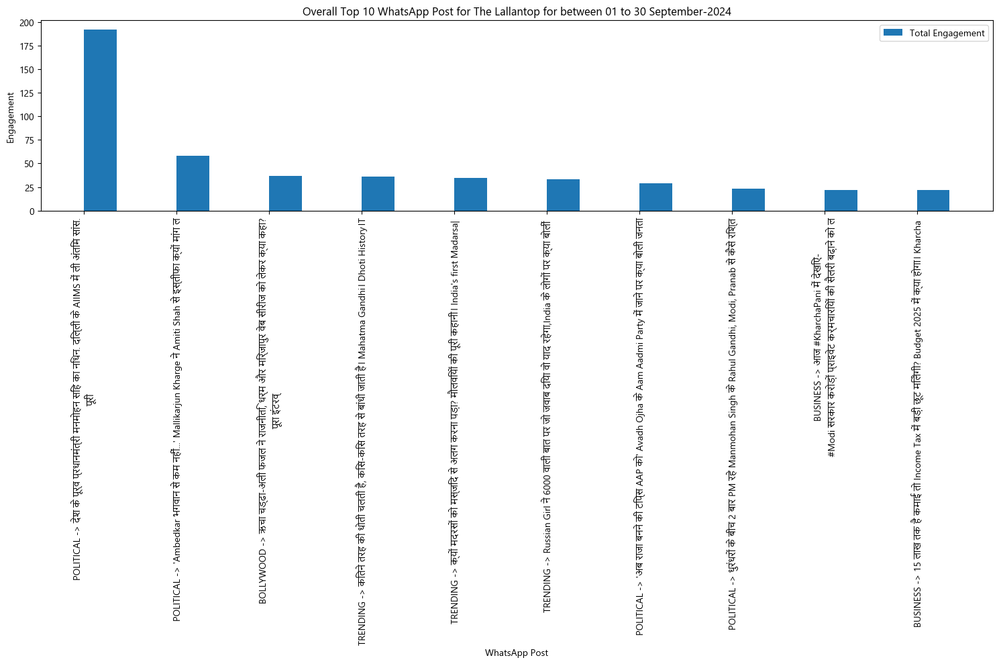

C:\Users\nilotpal.kumar\AppData\Local\Temp\ipykernel_12612\10751717.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["Channel_Caption"] = df["Category"] + " -> " + df["Stories"]
C:\Users\nilotpal.kumar\AppData\Local\Temp\ipykernel_12612\10751717.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["shrt_caption"] = df["Channel_Caption"].str.slice(0,100)
C:\Users\nilotpal.kumar\AppData\Local\Temp\ipykernel_12612\10751717.py:29: UserWarning: Glyph 9670 (\N{BLACK DIAMOND}) missing from font(s) Nirmala 

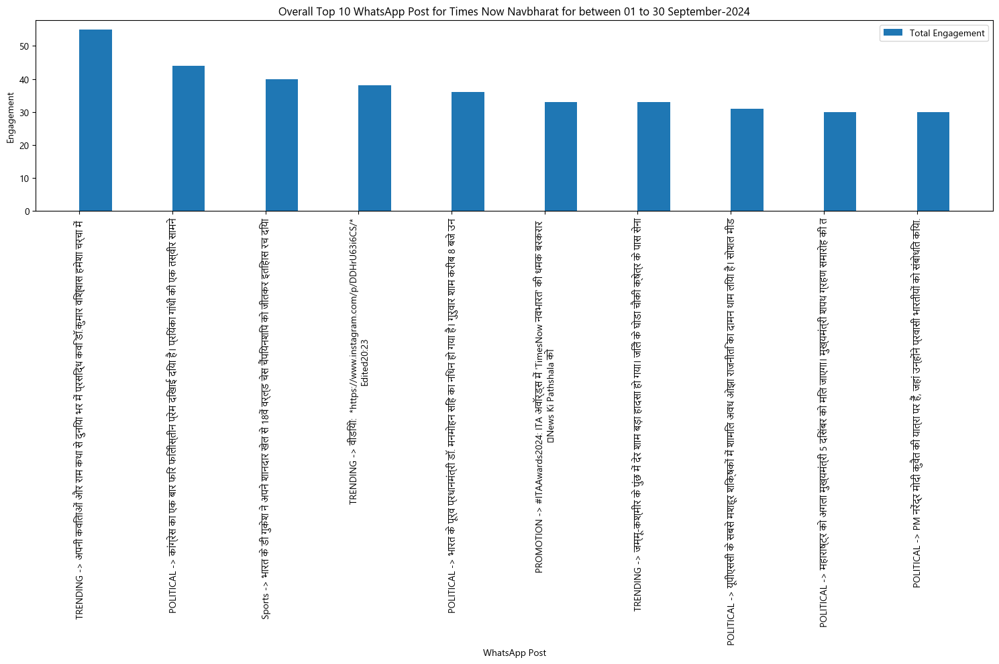

C:\Users\nilotpal.kumar\AppData\Local\Temp\ipykernel_12612\10751717.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["Channel_Caption"] = df["Category"] + " -> " + df["Stories"]
C:\Users\nilotpal.kumar\AppData\Local\Temp\ipykernel_12612\10751717.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["shrt_caption"] = df["Channel_Caption"].str.slice(0,100)


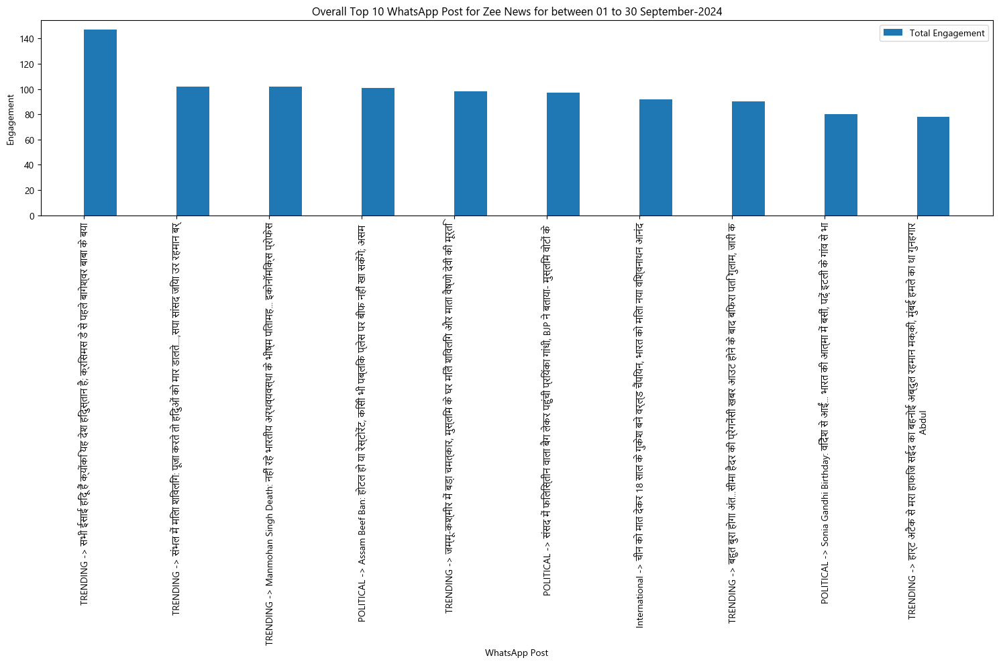

In [76]:
# For each unique 'ownerFullName', we will find the top 5 rows based on 'videoViewCount'
top_5_posts_by_channel = df_hindi_comp.groupby('Channel').apply(
    lambda x: x.nlargest(10, 'Engagement')
).reset_index(drop=True)

for channel in top_5_posts_by_channel.Channel.unique():
    df = top_5_posts_by_channel[top_5_posts_by_channel["Channel"] == channel]
    df["Channel_Caption"] = df["Category"] + " -> " + df["Stories"]
    df["shrt_caption"] = df["Channel_Caption"].str.slice(0,100)
    dff = df[['Date', 'Time', 'Channel', 'Stories','Category', 'Engagement']]
    dff.to_excel(f"df_top10_WA_Post_01_31Decv24{channel}.xlsx")
    plt.rcParams['font.family'] = 'Nirmala UI'
    plt.figure(figsize=(15, 10))
    x = np.arange(len(df['Engagement']))
    # Create the bar plots side-by-side
    bar_width = 0.35
    plt.bar(x + bar_width/2, df['Engagement'], bar_width, label='Total Engagement')

    # Add labels and title
    plt.xlabel('WhatsApp Post')
    plt.xticks(x, df['shrt_caption'], rotation=90)
    plt.ylabel('Engagement')
    plt.title(f'Overall Top 10 WhatsApp Post for {channel} for between 01 to 30 September-2024')

    # Add a legend
    plt.legend()

    # Show the plot
    plt.tight_layout()
    plt.show()

In [77]:
df

,Date,Time,Channel,Stories,url,Category,Engagement,Channel_Caption,shrt_caption
110,10/9/2024,12:50,Zee News,Breaking News: जाकिर ने Pakistan की लड़कियों को...,https://youtu.be/SxIuKgikMxs,International,143,International -> Breaking News: जाकिर ने Pakis...,International -> Breaking News: जाकिर ने Pakis...
111,10/4/2024,08:40,Zee News,हसन नसरल्लाह के उत्तराधिकारी को इजरायल ने 8 दि...,https://zeenews.india.com/hindi/world/israel-t...,War,100,War -> हसन नसरल्लाह के उत्तराधिकारी को इजरायल ...,War -> हसन नसरल्लाह के उत्तराधिकारी को इजरायल ...
112,10/2/2024,23:19,Zee News,DNA: ईरान युद्ध के बीच योगी की चेतावनी! Israel...,https://youtu.be/v7a4rE13jKA,TV SHOW,98,TV SHOW -> DNA: ईरान युद्ध के बीच योगी की चेता...,TV SHOW -> DNA: ईरान युद्ध के बीच योगी की चेता...
113,10/26/2024,21:37,Zee News,"Bangladesh: डोल गया यूनूस का सिंहासन, बांग्लाद...",https://zeenews.india.com/hindi/world/banglade...,International,96,International -> Bangladesh: डोल गया यूनूस का ...,International -> Bangladesh: डोल गया यूनूस का ...
114,10/22/2024,09:22,Zee News,"लॉरेंस बिश्नोई के एनकाउंटर पर 1,11,11,111 रुपय...",https://zeenews.india.com/hindi/india/karni-se...,CRIME,95,"CRIME -> लॉरेंस बिश्नोई के एनकाउंटर पर 1,11,11...","CRIME -> लॉरेंस बिश्नोई के एनकाउंटर पर 1,11,11..."
115,10/10/2024,07:26,Zee News,Ratan Tata: ₹3800 करोड़ की संपत्ति छोड़ गए हैं...,https://zeenews.india.com/hindi/business/ratan...,BUSINESS,94,BUSINESS -> Ratan Tata: ₹3800 करोड़ की संपत्ति...,BUSINESS -> Ratan Tata: ₹3800 करोड़ की संपत्ति...
116,10/10/2024,12:36,Zee News,Ratan Tata Tribute : आकाश में दफनाया जाएगा...क...,https://zeenews.india.com/hindi/india/tower-of...,BUSINESS,93,BUSINESS -> Ratan Tata Tribute : आकाश में दफना...,BUSINESS -> Ratan Tata Tribute : आकाश में दफना...
117,10/1/2024,13:25,Zee News,खुद की बेटी शादीशुदा तो दूसरी लड़कियों को संन्...,https://zeenews.india.com/hindi/india/sadhguru...,TRENDING,92,TRENDING -> खुद की बेटी शादीशुदा तो दूसरी लड़क...,TRENDING -> खुद की बेटी शादीशुदा तो दूसरी लड़क...
118,10/22/2024,14:21,Zee News,आप भगत सिंह जैसे क्रांतिकारी... गैंगस्टर लॉरें...,https://zeenews.india.com/hindi/india/maharash...,TRENDING,91,TRENDING -> आप भगत सिंह जैसे क्रांतिकारी... गै...,TRENDING -> आप भगत सिंह जैसे क्रांतिकारी... गै...
119,10/24/2024,12:46,Zee News,Pakistan: दिवाली के मौके पर पाकिस्तानी हिंदुओं...,https://zeenews.india.com/hindi/world/pakistan...,International,86,International -> Pakistan: दिवाली के मौके पर प...,International -> Pakistan: दिवाली के मौके पर प...


In [78]:
# Sort the DataFrame by 'Engagement' in descending order
sorted_df = df_hindi_comp.sort_values(by='Engagement', ascending=False)

# Retrieve the top 100 rows
top_100_rows = sorted_df.head(100)
top_100_rows

,Date,Time,Channel,Stories,url,Category,Engagement
978,10/10/2024,00:04,Aaj Tak,#BIGBREAKINGNEWS\nदेशभर में शोक की लहर दौड़ गई...,https://tinyurl.com/59923sjt,TRENDING,13870
11,10/1/2024,21:30,Aaj Tak,शर्मनाक !\nमहाराष्ट्र में मां की हत्या करके उस...,https://tinyurl.com/4kuuhve9,CRIME,10166
2406,10/21/2024,21:34,Aaj Tak,शर्मनाक !\nकरवाचौथ मनाने के लिए अयोध्या से कान...,https://tinyurl.com/4fbbc5sb,CRIME,9733
988,10/10/2024,18:58,Aaj Tak,टाटा संस के मानद चेयरमैन रतन टाटा का 86 साल की...,https://tinyurl.com/2drvj6xy,BUSINESS,9617
983,10/10/2024,13:26,Aaj Tak,टाटा संस के मानद चेयरमैन रतन टाटा के निधन के ब...,"https://tinyurl.com/2drvj6xy, https://tinyurl....",TRENDING,9008
...,...,...,...,...,...,...,...
1001,10/11/2024,19:07,Aaj Tak,महाराष्ट्र विधानसभा चुनाव 2024 के चलते आचार सं...,https://tinyurl.com/52fve3n2,ELECTION,3380
997,10/11/2024,14:12,Aaj Tak,#BIGBREAKINGNEWS \nनोएल टाटा को टाटा ट्रस्ट्स ...,https://tinyurl.com/mwe6tht3,BUSINESS,3376
982,10/10/2024,12:07,Aaj Tak,अमेरिका में नवंबर में प्रस्तावित राष्ट्रपति चु...,https://tinyurl.com/yc8c94vm,International,3354
2080,10/15/2024,19:06,Aaj Tak,विश्नोई समाज के राष्ट्रीय अध्यक्ष देवेंद्र बिश...,https://tinyurl.com/4abmys26,TRENDING,3349


In [79]:
top_100_rows.reset_index(drop=True,inplace=True)
top_100_rows

,Date,Time,Channel,Stories,url,Category,Engagement
0,10/10/2024,00:04,Aaj Tak,#BIGBREAKINGNEWS\nदेशभर में शोक की लहर दौड़ गई...,https://tinyurl.com/59923sjt,TRENDING,13870
1,10/1/2024,21:30,Aaj Tak,शर्मनाक !\nमहाराष्ट्र में मां की हत्या करके उस...,https://tinyurl.com/4kuuhve9,CRIME,10166
2,10/21/2024,21:34,Aaj Tak,शर्मनाक !\nकरवाचौथ मनाने के लिए अयोध्या से कान...,https://tinyurl.com/4fbbc5sb,CRIME,9733
3,10/10/2024,18:58,Aaj Tak,टाटा संस के मानद चेयरमैन रतन टाटा का 86 साल की...,https://tinyurl.com/2drvj6xy,BUSINESS,9617
4,10/10/2024,13:26,Aaj Tak,टाटा संस के मानद चेयरमैन रतन टाटा के निधन के ब...,"https://tinyurl.com/2drvj6xy, https://tinyurl....",TRENDING,9008
...,...,...,...,...,...,...,...
95,10/11/2024,19:07,Aaj Tak,महाराष्ट्र विधानसभा चुनाव 2024 के चलते आचार सं...,https://tinyurl.com/52fve3n2,ELECTION,3380
96,10/11/2024,14:12,Aaj Tak,#BIGBREAKINGNEWS \nनोएल टाटा को टाटा ट्रस्ट्स ...,https://tinyurl.com/mwe6tht3,BUSINESS,3376
97,10/10/2024,12:07,Aaj Tak,अमेरिका में नवंबर में प्रस्तावित राष्ट्रपति चु...,https://tinyurl.com/yc8c94vm,International,3354
98,10/15/2024,19:06,Aaj Tak,विश्नोई समाज के राष्ट्रीय अध्यक्ष देवेंद्र बिश...,https://tinyurl.com/4abmys26,TRENDING,3349


In [80]:
top_5_posts_by_channel.columns

Index(['Date', 'Time', 'Channel', 'Stories', 'url', 'Category', 'Engagement'], dtype='object')

In [167]:
top_100_rows.to_excel("WhatsApp Hindi Channel Top 100 posts as per Engaement for 01 to 15 October-2024.xlsx")

In [127]:
top_100_rows[["Date","Time","Channel","Stories","Category","Engagement"]].head(10)

,Date,Time,Channel,Stories,Category,Engagement
0,9/21/2024,21:42,Aaj Tak,Quiz Time: क्या इस आसान से सवाल का जवाब दे पाए...,QUIZ,10630
1,9/14/2024,22:03,Aaj Tak,Quiz Time: क्या इस आसान से सवाल का जवाब दे पाए...,QUIZ,9489
2,9/4/2024,22:32,Aaj Tak,सैम पित्रोदा ने कहा कि कांग्रेस नेता राहुल गां...,POLITICAL,8790
3,9/8/2024,21:42,Aaj Tak,Quiz Time: क्या इस आसान से सवाल का जवाब दे पाए...,QUIZ,8632
4,9/6/2024,21:33,Aaj Tak,रेसलर विनेश फोगाट ने हरियाणा विधानसभा चुनाव से...,ELECTION,7505
5,9/2/2024,14:03,Aaj Tak,सुप्रीम कोर्ट ने बुलडोजर कार्रवाई पर गंभीर सवा...,TRENDING,7180
6,9/7/2024,22:37,Aaj Tak,"पाक सेना प्रमुख ने कहा, 'चाहे वह 1948, 1965, 1...",International,7160
7,9/19/2024,21:15,Aaj Tak,तिरुपति मंदिर के प्रसाद में फिश ऑयल मिलने की ब...,TRENDING,7158
8,9/15/2024,22:48,Aaj Tak,शर्मनाक!\nमध्य प्रदेश: बेटी की बलात्कार के बाद...,CRIME,7050
9,9/17/2024,21:15,Aaj Tak,भारत और बांग्लादेश के बीच पहला टेस्ट मैच से पह...,Sports,6801


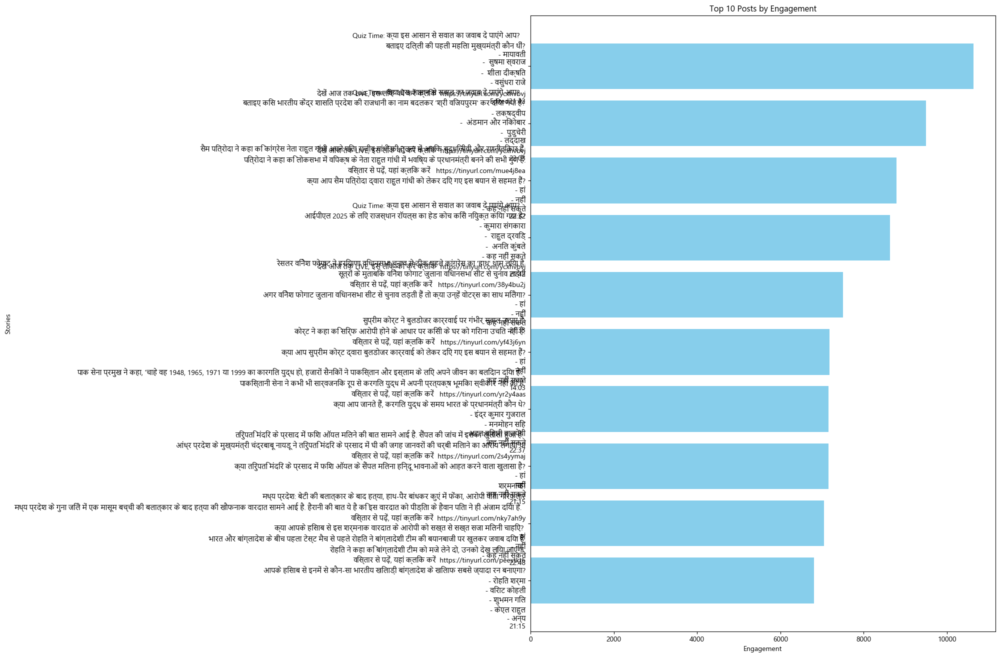

In [128]:
import matplotlib.pyplot as plt

# Set the index to the top 100 posts
top_100_posts = top_100_rows.nlargest(100, 'Engagement')

# Top 10 posts by engagement
top_10_posts = top_100_posts.nlargest(10, 'Engagement')

# Plotting the top 10 posts by engagement
plt.figure(figsize=(12, 16))
plt.barh(top_10_posts['Stories'], top_10_posts['Engagement'], color='skyblue')
plt.xlabel('Engagement')
plt.ylabel('Stories')
plt.title('Top 10 Posts by Engagement')
plt.gca().invert_yaxis()
plt.show()


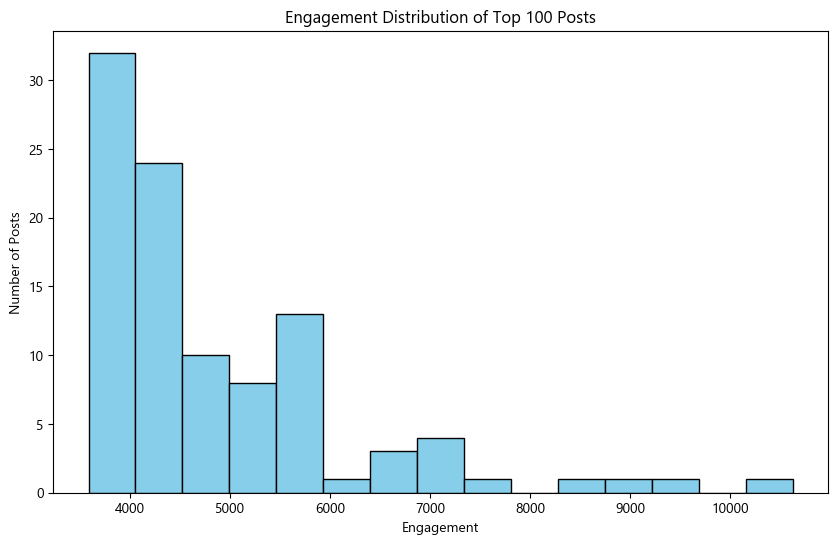

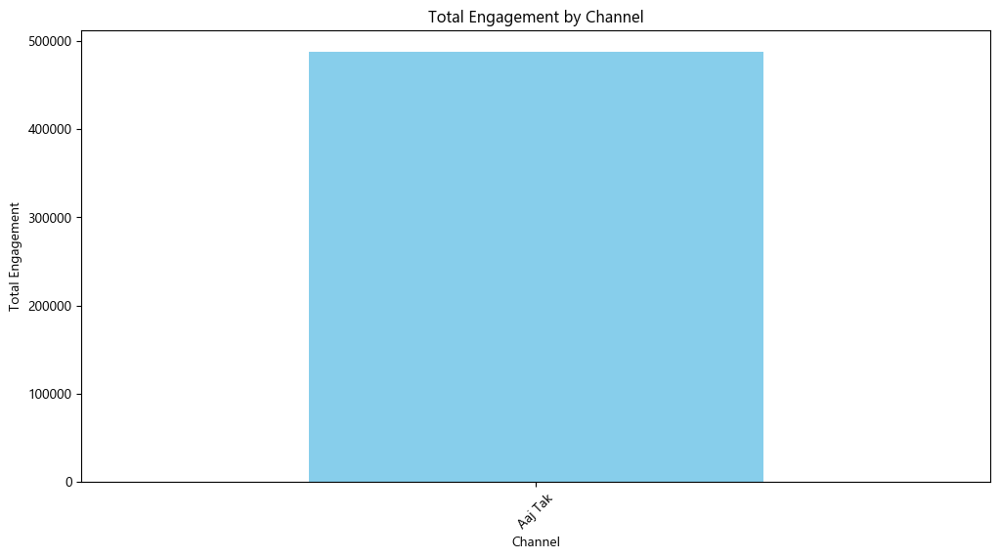

In [129]:
# Engagement distribution histogram
plt.figure(figsize=(10, 6))
plt.hist(top_100_rows['Engagement'], bins=15, color='skyblue', edgecolor='black')
plt.xlabel('Engagement')
plt.ylabel('Number of Posts')
plt.title('Engagement Distribution of Top 100 Posts')
plt.show()

# Engagement by channel
engagement_by_channel = top_100_rows.groupby('Channel')['Engagement'].sum().sort_values(ascending=False)

plt.figure(figsize=(12, 6))
engagement_by_channel.plot(kind='bar', color='skyblue')
plt.xlabel('Channel')
plt.ylabel('Total Engagement')
plt.title('Total Engagement by Channel')
plt.xticks(rotation=45)
plt.show()


<Axes: ylabel='Channel'>

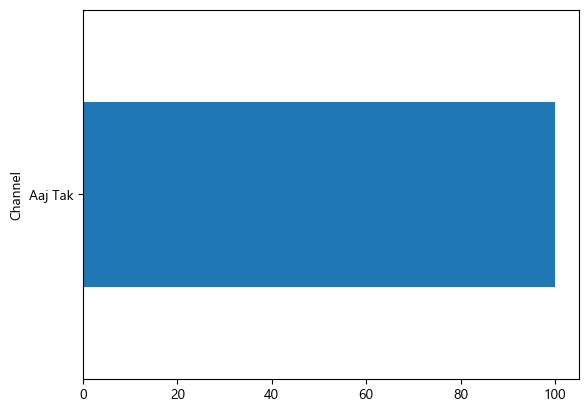

In [122]:
top_100_rows["Channel"].value_counts().sort_values().plot(kind='barh')

In [123]:
df_followers = pd.read_excel("DailyFollowers.xlsx") 
df_followers

,DATE,TIME,AAJTAK,NEWS 18,DIFFERENCE
0,2023-09-26,2PM,5179268,7133823,1954555
1,2023-09-26,5PM,5225344,7181870,1956526
2,2023-09-26,8PM,5281607,7240825,1959218
3,2023-09-26,9PM,5303607,7264745,1961138
4,2023-09-27,11AM,5467765,7419965,1952200
...,...,...,...,...,...
149,2023-10-12,17:00:00,9528033,10783637,1255604
150,2023-10-12,19:00:00,9544339,10795951,1251612
151,2023-10-12,20:30:00,9570686,10815663,1244977
152,2023-10-12,21:00:00,9577101,10820877,1243776


In [124]:
df_AT = df_followers.groupby(["DATE"])["AAJTAK"].max().reset_index()
df_AT

,DATE,AAJTAK
0,2023-09-26,5303607
1,2023-09-27,5644407
2,2023-09-28,5991341
3,2023-09-29,6375535
4,2023-09-30,6708928
5,2023-10-01,6969638
6,2023-10-02,7254077
7,2023-10-03,7523797
8,2023-10-04,7785362
9,2023-10-05,8067857


In [125]:
df_N18 = df_followers.groupby(["DATE"])["NEWS 18"].max().reset_index()
df_N18

,DATE,NEWS 18
0,2023-09-26,7264745
1,2023-09-27,7582208
2,2023-09-28,7897077
3,2023-09-29,8246593
4,2023-09-30,8522620
5,2023-10-01,8740825
6,2023-10-02,8975832
7,2023-10-03,9205957
8,2023-10-04,9426969
9,2023-10-05,9647996


In [338]:
df_diff = df_followers.groupby(["DATE"])["DIFFERENCE"].max().reset_index()
df_diff

,DATE,DIFFERENCE
0,2023-09-26,1961138
1,2023-09-27,1952200
2,2023-09-28,1927723
3,2023-09-29,1900566
4,2023-09-30,1859879
5,2023-10-01,1805077
6,2023-10-02,1751615
7,2023-10-03,1712255
8,2023-10-04,1667356
9,2023-10-05,1621707


In [339]:
df_daily_followers = pd.merge(df_AT, df_N18, on=["DATE"], how='left')
df_daily_followers = pd.merge(df_daily_followers, df_diff, on=["DATE"], how='left')

df_daily_followers = df_daily_followers.sort_values(by='DATE',ascending=True)
df_daily_followers

,DATE,AAJTAK,NEWS 18,DIFFERENCE
0,2023-09-26,5303607,7264745,1961138
1,2023-09-27,5644407,7582208,1952200
2,2023-09-28,5991341,7897077,1927723
3,2023-09-29,6375535,8246593,1900566
4,2023-09-30,6708928,8522620,1859879
5,2023-10-01,6969638,8740825,1805077
6,2023-10-02,7254077,8975832,1751615
7,2023-10-03,7523797,9205957,1712255
8,2023-10-04,7785362,9426969,1667356
9,2023-10-05,8067857,9647996,1621707


C:\ProgramData\anaconda3\envs\jupyter-notebook\Lib\site-packages\_plotly_utils\basevalidators.py:105: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  v = v.dt.to_pydatetime()


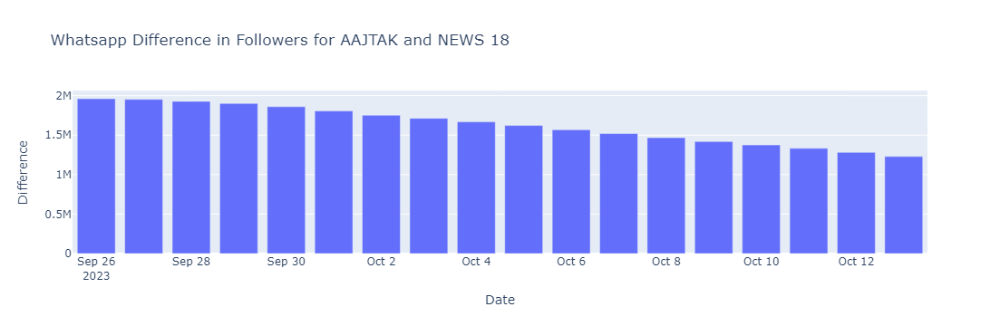

In [207]:
import plotly.graph_objects as go
import pandas as pd

# Sample data
# data = pd.DataFrame({
#     'DATE': pd.to_datetime(['2023-09-26', '2023-09-27', '2023-09-28', '2023-09-29', '2023-09-30', '2023-10-01',
#                             '2023-10-02', '2023-10-03', '2023-10-04', '2023-10-05', '2023-10-06', '2023-10-07',
#                             '2023-10-08', '2023-10-09', '2023-10-10', '2023-10-11', '2023-10-12', '2023-10-13']),
#     'AAJTAK': [5303607, 5644407, 5991341, 6375535, 6708928, 6969638, 7254077, 7523797, 7785362, 8067857, 8334175, 8543526, 8774413, 8969426, 9190391, 9401399, 9577101, 9639099],
#     'NEWS 18': [7264745, 7582208, 7897077, 8246593, 8522620, 8740825, 8975832, 9205957, 9426969, 9647996, 9859425, 10024856, 10203447, 10357594, 10531506, 10689890, 10820877, 10868211],
#     'DIFFERENCE': [1961138, 1952200, 1927723, 1900566, 1859879, 1805077, 1751615, 1712255, 1667356, 1621707, 1567607, 1518972, 1466951, 1418508, 1375309, 1332264, 1281192, 1229112]
# })

# Create a bar chart for the DIFFERENCE column
fig = go.Figure(go.Bar(x=df_daily_followers['DATE'], y=df_daily_followers['DIFFERENCE']))

fig.update_layout(title='Whatsapp Difference in Followers for AAJTAK and NEWS 18',
                  xaxis_title='Date',
                  yaxis_title='Difference')

# Show the bar chart
fig.show()


C:\ProgramData\anaconda3\envs\jupyter-notebook\Lib\site-packages\_plotly_utils\basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



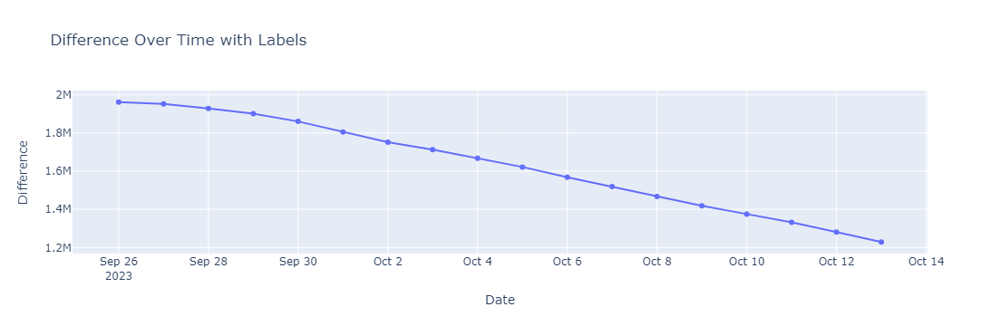

In [208]:
import plotly.graph_objects as go
import pandas as pd

# Sample data
data = pd.DataFrame({
    'DATE': pd.to_datetime(['2023-09-26', '2023-09-27', '2023-09-28', '2023-09-29', '2023-09-30', '2023-10-01',
                            '2023-10-02', '2023-10-03', '2023-10-04', '2023-10-05', '2023-10-06', '2023-10-07',
                            '2023-10-08', '2023-10-09', '2023-10-10', '2023-10-11', '2023-10-12', '2023-10-13']),
    'DIFFERENCE': [1961138, 1952200, 1927723, 1900566, 1859879, 1805077, 1751615, 1712255, 1667356, 1621707, 1567607, 1518972, 1466951, 1418508, 1375309, 1332264, 1281192, 1229112]
})

# Create a line plot for the DIFFERENCE data
fig = go.Figure(data=go.Scatter(x=data['DATE'], y=data['DIFFERENCE'], mode='lines+markers', name='DIFFERENCE',
                               text=data['DIFFERENCE'], textposition='top center', texttemplate='%{text}'))

# Set the plot title and axis labels
fig.update_layout(
    title='Difference Over Time with Labels',
    xaxis_title='Date',
    yaxis_title='Difference'
)

# Show the line plot
fig.show()


In [ ]:
import plotly.graph_objects as go
import pandas as pd

# Sample data
data = pd.DataFrame({
    'DATE': pd.to_datetime(['2023-09-26', '2023-09-27', '2023-09-28', '2023-09-29', '2023-09-30', '2023-10-01',
                            '2023-10-02', '2023-10-03', '2023-10-04', '2023-10-05', '2023-10-06', '2023-10-07',
                            '2023-10-08', '2023-10-09', '2023-10-10', '2023-10-11', '2023-10-12', '2023-10-13']),
    'DIFFERENCE': [1961138, 1952200, 1927723, 1900566, 1859879, 1805077, 1751615, 1712255, 1667356, 1621707, 1567607, 1518972, 1466951, 1418508, 1375309, 1332264, 1281192, 1229112]
})

# Create a line plot for the DIFFERENCE data
fig = go.Figure(data=go.Scatter(x=data['DATE'], y=data['DIFFERENCE'], mode='lines+markers', name='DIFFERENCE'))

# Set the plot title and axis labels
fig.update_layout(
    title='Difference Over Time',
    xaxis_title='Date',
    yaxis_title='Difference'
)

# Show the line plot
fig.show()


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Sample data
data = pd.DataFrame({
    'DATE': pd.to_datetime(['2023-09-26', '2023-09-27', '2023-09-28', '2023-09-29', '2023-09-30', '2023-10-01',
                            '2023-10-02', '2023-10-03', '2023-10-04', '2023-10-05', '2023-10-06', '2023-10-07',
                            '2023-10-08', '2023-10-09', '2023-10-10', '2023-10-11', '2023-10-12', '2023-10-13']),
    'DIFFERENCE': [1961138, 1952200, 1927723, 1900566, 1859879, 1805077, 1751615, 1712255, 1667356, 1621707, 1567607, 1518972, 1466951, 1418508, 1375309, 1332264, 1281192, 1229112]
})

# Create a line plot using Seaborn
plt.figure(figsize=(10, 3))
sns.lineplot(data=data, x='DATE', y='DIFFERENCE')
plt.title('WhatsApp Followers Difference Over Time Aaj Tak Vs News 18')
plt.xlabel('Date')
plt.ylabel('Difference in millons')
plt.xticks(rotation=45)

# Set y-axis limits to start from 0
plt.ylim(0, max(data['DIFFERENCE']) + 100000)  # Adjust the upper limit as needed

# Show the line plot
plt.show()


In [ ]:
import plotly.graph_objects as go
import pandas as pd

# Sample data
data = pd.DataFrame({
    'DATE': pd.to_datetime(['2023-09-26', '2023-09-27', '2023-09-28', '2023-09-29', '2023-09-30', '2023-10-01',
                            '2023-10-02', '2023-10-03', '2023-10-04', '2023-10-05', '2023-10-06', '2023-10-07',
                            '2023-10-08', '2023-10-09', '2023-10-10', '2023-10-11', '2023-10-12', '2023-10-13']),
    'DIFFERENCE': [1961138, 1952200, 1927723, 1900566, 1859879, 1805077, 1751615, 1712255, 1667356, 1621707, 1567607, 1518972, 1466951, 1418508, 1375309, 1332264, 1281192, 1229112]
})

# Create a line plot in Plotly
fig = go.Figure()

# Add the line trace
fig.add_trace(go.Scatter(x=data['DATE'], y=data['DIFFERENCE'], mode='lines+markers', name='Difference'))

# Set layout properties
fig.update_layout(
    title='Difference Over Time',
    xaxis_title='Date',
    yaxis_title='Difference',
    paper_bgcolor='white',  # Set background color to white
)

# Show the Plotly plot
fig.show()


In [ ]:
import plotly.graph_objects as go
import pandas as pd

# Sample data
data = pd.DataFrame({
    'DATE': pd.to_datetime(['2023-09-26', '2023-09-27', '2023-09-28', '2023-09-29', '2023-09-30', '2023-10-01',
                            '2023-10-02', '2023-10-03', '2023-10-04', '2023-10-05', '2023-10-06', '2023-10-07',
                            '2023-10-08', '2023-10-09', '2023-10-10', '2023-10-11', '2023-10-12', '2023-10-13']),
    'DIFFERENCE': [1961138, 1952200, 1927723, 1900566, 1859879, 1805077, 1751615, 1712255, 1667356, 1621707, 1567607, 1518972, 1466951, 1418508, 1375309, 1332264, 1281192, 1229112]
})

# Create a line plot in Plotly
fig = go.Figure()

# Add the line trace
fig.add_trace(go.Scatter(x=data['DATE'], y=data['DIFFERENCE'], mode='lines+markers', name='Difference'))

# Set layout properties
fig.update_layout(
    title='WhatsApp Followers Difference Over Time Aaj Tak Vs News 18',
    xaxis_title='Date',
    yaxis_title='Difference',
    paper_bgcolor='white',  # Set background color to white
)

# Add annotations for the starting and ending values
start_value = data['DIFFERENCE'].iloc[0]
end_value = data['DIFFERENCE'].iloc[-1]

fig.add_annotation(
    text=f'Start: {start_value}',
    x=data['DATE'].iloc[0],
    y=start_value,
    showarrow=True,
    arrowhead=2,
    arrowcolor='green',
    arrowwidth=2,
#     arrowhead=4,
    bgcolor='white'
)

fig.add_annotation(
    text=f'End: {end_value}',
    x=data['DATE'].iloc[-1],
    y=end_value,
    showarrow=True,
    arrowhead=2,
    arrowcolor='red',
    arrowwidth=2,
#     arrowhead=4,
    bgcolor='white'
)

# Show the Plotly plot
fig.show()


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

# Load the data
data = pd.DataFrame({
    'DATE': pd.to_datetime(['2023-09-26', '2023-09-27', '2023-09-28', '2023-09-29', '2023-09-30', '2023-10-01',
                            '2023-10-02', '2023-10-03', '2023-10-04', '2023-10-05', '2023-10-06', '2023-10-07',
                            '2023-10-08', '2023-10-09', '2023-10-10', '2023-10-11', '2023-10-12', '2023-10-13']),
    'AAJTAK': [5303607, 5644407, 5991341, 6375535, 6708928, 6969638, 7254077, 7523797, 7785362, 8067857, 8334175, 8543526, 8774413, 8969426, 9190391, 9401399, 9577101, 9639099],
    'NEWS 18': [7264745, 7582208, 7897077, 8246593, 8522620, 8740825, 8975832, 9205957, 9426969, 9647996, 9859425, 10024856, 10203447, 10357594, 10531506, 10689890, 10820877, 10868211]
})

# Calculate linear trends
model_AAJTAK = LinearRegression().fit(data.index.values.reshape(-1, 1), data['AAJTAK'])
model_NEWS18 = LinearRegression().fit(data.index.values.reshape(-1, 1), data['NEWS 18'])

# Calculate the meeting date
meeting_date = (model_NEWS18.intercept_ - model_AAJTAK.intercept_) / (model_AAJTAK.coef_ - model_NEWS18.coef_)

# Convert the meeting date to a valid date format
meeting_date = pd.to_datetime(data['DATE'].iloc[0] + pd.DateOffset(days=int(meeting_date[0])))

# Create a plot
plt.figure(figsize=(10, 6))
plt.plot(data['DATE'], data['AAJTAK'], label='AAJTAK')
plt.plot(data['DATE'], data['NEWS 18'], label='NEWS 18')
plt.axvline(meeting_date, color='red', linestyle='--', label=f'Meeting Date: {meeting_date.date()}')
plt.xlabel('Date')
plt.ylabel('Viewership')
plt.title('AAJTAK vs. NEWS 18 Viewership Forecast')
plt.legend()
plt.xticks(rotation=45)
plt.show()

print(f"The projected meeting date is: {meeting_date.date()}")


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import LinearRegression

# Load the data
data = pd.DataFrame({
    'DATE': pd.to_datetime(['2023-09-26', '2023-09-27', '2023-09-28', '2023-09-29', '2023-09-30', '2023-10-01',
                            '2023-10-02', '2023-10-03', '2023-10-04', '2023-10-05', '2023-10-06', '2023-10-07',
                            '2023-10-08', '2023-10-09', '2023-10-10', '2023-10-11', '2023-10-12', '2023-10-13']),
    'AAJTAK': [5303607, 5644407, 5991341, 6375535, 6708928, 6969638, 7254077, 7523797, 7785362, 8067857, 8334175, 8543526, 8774413, 8969426, 9190391, 9401399, 9577101, 9639099],
    'NEWS 18': [7264745, 7582208, 7897077, 8246593, 8522620, 8740825, 8975832, 9205957, 9426969, 9647996, 9859425, 10024856, 10203447, 10357594, 10531506, 10689890, 10820877, 10868211]
})

# Calculate linear trends
model_AAJTAK = LinearRegression().fit(data.index.values.reshape(-1, 1), data['AAJTAK'])
model_NEWS18 = LinearRegression().fit(data.index.values.reshape(-1, 1), data['NEWS 18'])

# Calculate the meeting date
meeting_date = (model_NEWS18.intercept_ - model_AAJTAK.intercept_) / (model_AAJTAK.coef_ - model_NEWS18.coef_)

# Extend the dataframe to include future dates
future_dates = pd.date_range(start=data['DATE'].iloc[0], periods=30, freq='D')[19:]
extended_data = pd.DataFrame({'DATE': future_dates})[19:]

# Predict future values using the linear regression models
extended_data['AAJTAK'] = model_AAJTAK.predict(np.arange(len(data), len(data) + len(extended_data)).reshape(-1, 1))
extended_data['NEWS 18'] = model_NEWS18.predict(np.arange(len(data), len(data) + len(extended_data)).reshape(-1, 1))

# Combine the original and extended data
combined_data = pd.concat([data, extended_data], ignore_index=True)

# Create a plot with different colors for observed and forecasted values
plt.figure(figsize=(10, 6))
plt.plot(combined_data['DATE'], combined_data['AAJTAK'], label='AAJTAK (Observed)', color='blue')
plt.plot(combined_data['DATE'], combined_data['NEWS 18'], label='NEWS 18 (Observed)', color='green')
plt.plot(extended_data['DATE'], extended_data['AAJTAK'], label='AAJTAK (Forecast)', linestyle='--', color='red')
plt.plot(extended_data['DATE'], extended_data['NEWS 18'], label='NEWS 18 (Forecast)', linestyle='--', color='orange')
plt.axvline(meeting_date, color='purple', linestyle='--', label=f'Meeting Date: {meeting_date.date()}')
plt.xlabel('Date')
plt.ylabel('Viewership')
plt.title('AAJTAK vs. NEWS 18 Viewership Forecast')
plt.legend()
plt.xticks(rotation=45)
plt.show()

print(f"The projected meeting date is: {meeting_date.date()}")


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import LinearRegression

# Load the data
data = pd.DataFrame({
    'DATE': pd.to_datetime(['2023-09-26', '2023-09-27', '2023-09-28', '2023-09-29', '2023-09-30', '2023-10-01',
                            '2023-10-02', '2023-10-03', '2023-10-04', '2023-10-05', '2023-10-06', '2023-10-07',
                            '2023-10-08', '2023-10-09', '2023-10-10', '2023-10-11', '2023-10-12', '2023-10-13']),
    'AAJTAK': [5303607, 5644407, 5991341, 6375535, 6708928, 6969638, 7254077, 7523797, 7785362, 8067857, 8334175, 8543526, 8774413, 8969426, 9190391, 9401399, 9577101, 9639099],
    'NEWS 18': [7264745, 7582208, 7897077, 8246593, 8522620, 8740825, 8975832, 9205957, 9426969, 9647996, 9859425, 10024856, 10203447, 10357594, 10531506, 10689890, 10820877, 10868211]
})

# Calculate linear trends
model_AAJTAK = LinearRegression().fit(data.index.values.reshape(-1, 1), data['AAJTAK'])
model_NEWS18 = LinearRegression().fit(data.index.values.reshape(-1, 1), data['NEWS 18'])

# Calculate the meeting date
meeting_date = (model_NEWS18.intercept_ - model_AAJTAK.intercept_) / (model_AAJTAK.coef_ - model_NEWS18.coef_)

# Find the last date in the data
last_date = data['DATE'].iloc[-1]

# Extend the dataframe to include future dates starting from the day after the last date
future_dates = pd.date_range(start=last_date + pd.DateOffset(1), periods=30, freq='D')
extended_data = pd.DataFrame({'DATE': future_dates})

# Predict future values using the linear regression models
extended_data['AAJTAK'] = model_AAJTAK.predict(np.arange(len(data), len(data) + len(extended_data)).reshape(-1, 1))
extended_data['NEWS 18'] = model_NEWS18.predict(np.arange(len(data), len(data) + len(extended_data)).reshape(-1, 1))

# Combine the original and extended data
combined_data = pd.concat([data, extended_data], ignore_index=True)

# Create a plot with different colors for observed and forecasted values
plt.figure(figsize=(10, 6))
plt.plot(combined_data['DATE'], combined_data['AAJTAK'], label='AAJTAK (Observed)', color='blue')
plt.plot(combined_data['DATE'], combined_data['NEWS 18'], label='NEWS 18 (Observed)', color='green')
plt.plot(extended_data['DATE'], extended_data['AAJTAK'], label='AAJTAK (Forecast)', linestyle='--', color='red')
plt.plot(extended_data['DATE'], extended_data['NEWS 18'], label='NEWS 18 (Forecast)', linestyle='--', color='orange')
plt.axvline(meeting_date, color='purple', linestyle='--', label=f'Meeting Date: {meeting_date.date()}')
plt.xlabel('Date')
plt.ylabel('Viewership')
plt.title('AAJTAK vs. NEWS 18 Viewership Forecast')
plt.legend()
plt.xticks(rotation=45)
plt.show()

print(f"The projected meeting date is: {meeting_date.date()}")


In [ ]:
data.shape

In [ ]:
list(future_dates)

In [ ]:
meeting_date = (model_NEWS18.intercept_ - model_AAJTAK.intercept_) / (model_AAJTAK.coef_ - model_NEWS18.coef_)
meeting_date

In [ ]:
meeting_date

In [ ]:
extended_data['AAJTAK']


In [ ]:
extended_data['NEWS 18']

In [ ]:
list(future_dates)

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.svm import SVR
import datetime

# Load the data
data = pd.DataFrame({
    'DATE': pd.to_datetime(['2023-09-26', '2023-09-27', '2023-09-28', '2023-09-29', '2023-09-30', '2023-10-01',
                            '2023-10-02', '2023-10-03', '2023-10-04', '2023-10-05', '2023-10-06', '2023-10-07',
                            '2023-10-08', '2023-10-09', '2023-10-10', '2023-10-11', '2023-10-12', '2023-10-13']),
    'AAJTAK': [5303607, 5644407, 5991341, 6375535, 6708928, 6969638, 7254077, 7523797, 7785362, 8067857, 8334175, 8543526, 8774413, 8969426, 9190391, 9401399, 9577101, 9639099],
    'NEWS 18': [7264745, 7582208, 7897077, 8246593, 8522620, 8740825, 8975832, 9205957, 9426969, 9647996, 9859425, 10024856, 10203447, 10357594, 10531506, 10689890, 10820877, 10868211]
})

# Sort the data by date
data = data.sort_values(by='DATE')

# Initialize the SVR models with RBF kernel
svr_AAJTAK = SVR(kernel='rbf')
svr_NEWS18 = SVR(kernel='rbf')

# Train the models on observed data
X = np.arange(len(data)).reshape(-1, 1)
y_AAJTAK = data['AAJTAK']
y_NEWS18 = data['NEWS 18']
svr_AAJTAK.fit(X, y_AAJTAK)
svr_NEWS18.fit(X, y_NEWS18)

# Forecast future values
forecast_periods = 30  # Number of days to forecast
X_forecast = np.arange(len(data), len(data) + forecast_periods).reshape(-1, 1)
forecasted_AAJTAK = svr_AAJTAK.predict(X_forecast)
forecasted_NEWS18 = svr_NEWS18.predict(X_forecast)

# Create a new DataFrame for the forecasted data
forecast_dates = [data['DATE'].max() + datetime.timedelta(days=i) for i in range(1, forecast_periods + 1)]
forecast_data = pd.DataFrame({'DATE': forecast_dates, 'AAJTAK': forecasted_AAJTAK, 'NEWS 18': forecasted_NEWS18})

# Combine observed and forecasted data
combined_data = pd.concat([data, forecast_data], ignore_index=True)

# Create a plot with different colors for observed and forecasted values
plt.figure(figsize=(10, 6))
plt.plot(combined_data['DATE'], combined_data['AAJTAK'], label='AAJTAK (Observed)', color='blue')
plt.plot(combined_data['DATE'], combined_data['NEWS 18'], label='NEWS 18 (Observed)', color='green')
plt.plot(forecast_data['DATE'], forecast_data['AAJTAK'], label='AAJTAK (Forecast)', linestyle='--', color='red')
plt.plot(forecast_data['DATE'], forecast_data['NEWS 18'], label='NEWS 18 (Forecast)', linestyle='--', color='orange')
plt.xlabel('Date')
plt.ylabel('Viewership')
plt.title('AAJTAK vs. NEWS 18 Viewership Forecast with SVR RBF Kernel')
plt.legend()
plt.xticks(rotation=45)
plt.show()


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.svm import SVR
from sklearn.model_selection import train_test_split

# Load the data
data = pd.DataFrame({
    'DATE': pd.to_datetime(['2023-09-26', '2023-09-27', '2023-09-28', '2023-09-29', '2023-09-30', '2023-10-01',
                            '2023-10-02', '2023-10-03', '2023-10-04', '2023-10-05', '2023-10-06', '2023-10-07',
                            '2023-10-08', '2023-10-09', '2023-10-10', '2023-10-11', '2023-10-12', '2023-10-13']),
    'AAJTAK': [5303607, 5644407, 5991341, 6375535, 6708928, 6969638, 7254077, 7523797, 7785362, 8067857, 8334175, 8543526, 8774413, 8969426, 9190391, 9401399, 9577101, 9639099],
    'NEWS 18': [7264745, 7582208, 7897077, 8246593, 8522620, 8740825, 8975832, 9205957, 9426969, 9647996, 9859425, 10024856, 10203447, 10357594, 10531506, 10689890, 10820877, 10868211]
})

# Split the data into observed and forecast periods
observed_data = data
forecast_periods = 30  # Number of days to forecast
forecast_data = pd.DataFrame({'DATE': pd.date_range(data['DATE'].max(), periods=forecast_periods, freq='D')})

# Initialize the SVR models with RBF kernel
svr_AAJTAK = SVR(kernel='rbf')
svr_NEWS18 = SVR(kernel='rbf')

# Train the models on observed data
X = np.arange(len(observed_data)).reshape(-1, 1)
y_AAJTAK = observed_data['AAJTAK']
y_NEWS18 = observed_data['NEWS 18']
svr_AAJTAK.fit(X, y_AAJTAK)
svr_NEWS18.fit(X, y_NEWS18)

# Forecast future values
X_forecast = np.arange(len(observed_data), len(observed_data) + forecast_periods).reshape(-1, 1)
forecasted_AAJTAK = svr_AAJTAK.predict(X_forecast)
forecasted_NEWS18 = svr_NEWS18.predict(X_forecast)

# Add forecasted values to the forecast_data DataFrame
forecast_data['AAJTAK'] = forecasted_AAJTAK
forecast_data['NEWS 18'] = forecasted_NEWS18

# Combine observed and forecasted data
combined_data = pd.concat([observed_data, forecast_data], ignore_index=True)

# Create a plot
plt.figure(figsize=(10, 6))
plt.plot(combined_data['DATE'], combined_data['AAJTAK'], label='AAJTAK')
plt.plot(combined_data['DATE'], combined_data['NEWS 18'], label='NEWS 18')
plt.axvline(data['DATE'].max(), color='gray', linestyle='--', label='End of Observed Data')
plt.xlabel('Date')
plt.ylabel('Viewership')
plt.title('AAJTAK vs. NEWS 18 Viewership Forecast with RBF Kernel')
plt.legend()
plt.xticks(rotation=45)
plt.show()


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.svm import SVR
import seaborn as sns
import datetime

# Load the data
data = pd.DataFrame({
    'DATE': pd.to_datetime(['2023-09-26', '2023-09-27', '2023-09-28', '2023-09-29', '2023-09-30', '2023-10-01',
                            '2023-10-02', '2023-10-03', '2023-10-04', '2023-10-05', '2023-10-06', '2023-10-07',
                            '2023-10-08', '2023-10-09', '2023-10-10', '2023-10-11', '2023-10-12', '2023-10-13']),
    'AAJTAK': [5303607, 5644407, 5991341, 6375535, 6708928, 6969638, 7254077, 7523797, 7785362, 8067857, 8334175, 8543526, 8774413, 8969426, 9190391, 9401399, 9577101, 9639099],
    'NEWS 18': [7264745, 7582208, 7897077, 8246593, 8522620, 8740825, 8975832, 9205957, 9426969, 9647996, 9859425, 10024856, 10203447, 10357594, 10531506, 10689890, 10820877, 10868211]
})

# Initialize the SVR models with RBF kernel
svr_AAJTAK = SVR(kernel='rbf')
svr_NEWS18 = SVR(kernel='rbf')

# Train the models on observed data
X = np.arange(len(data)).reshape(-1, 1)
y_AAJTAK = data['AAJTAK']
y_NEWS18 = data['NEWS 18']
svr_AAJTAK.fit(X, y_AAJTAK)
svr_NEWS18.fit(X, y_NEWS18)

# Forecast future values
forecast_periods = 30  # Number of days to forecast
X_forecast = np.arange(len(data), len(data) + forecast_periods).reshape(-1, 1)
forecasted_AAJTAK = svr_AAJTAK.predict(X_forecast)
forecasted_NEWS18 = svr_NEWS18.predict(X_forecast)

# Create a new DataFrame for the forecasted data
forecast_dates = [data['DATE'].iloc[-1] + datetime.timedelta(days=i) for i in range(1, forecast_periods + 1)]
forecast_data = pd.DataFrame({'DATE': forecast_dates, 'AAJTAK': forecasted_AAJTAK, 'NEWS 18': forecasted_NEWS18})

# Combine observed and forecasted data
combined_data = pd.concat([data, forecast_data], ignore_index=True)

# Create a Seaborn lineplot to visualize the data
plt.figure(figsize=(10, 6))
sns.lineplot(data=combined_data, x='DATE', y='AAJTAK', label='AAJTAK', ci=None)
sns.lineplot(data=combined_data, x='DATE', y='NEWS 18', label='NEWS 18', ci=None)

plt.xlabel('Date')
plt.ylabel('Viewership')
plt.title('AAJTAK vs. NEWS 18 Viewership Forecast with SVR RBF Kernel')
plt.xticks(rotation=45)
plt.legend()
plt.show()


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# # Sample DataFrame
# data = {
#     'DATE': ['2023-09-26', '2023-09-27', '2023-09-28', '2023-09-29', '2023-09-30', '2023-10-01', '2023-10-02', '2023-10-03', '2023-10-04', '2023-10-05', '2023-10-06', '2023-10-07', '2023-10-08', '2023-10-09', '2023-10-10', '2023-10-11', '2023-10-12'],
#     'AAJTAK': [5303607, 5644407, 5991341, 6375535, 6708928, 6969638, 7254077, 7523797, 7785362, 8067857, 8334175, 8543526, 8774413, 8969426, 9190391, 9401399, 9446434],
#     'NEWS 18': [7264745, 7582208, 7897077, 8246593, 8522620, 8740825, 8975832, 9205957, 9426969, 9647996, 9859425, 10024856, 10203447, 10357594, 10531506, 10689890, 10725474],
#     'DIFFERENCE': [1961138, 1952200, 1927723, 1900566, 1859879, 1805077, 1751615, 1712255, 1667356, 1621707, 1567607, 1518972, 1466951, 1418508, 1375309, 1332264, 1281192]
# }

df = df_daily_followers

# Set the figure size
plt.figure(figsize=(12, 6))

# Create the first axis for 'AAJTAK' and 'NEWS 18'
ax1 = plt.gca()
# ax1.plot(df['DATE'], df['AAJTAK'], label='AAJTAK', color='blue')
# ax1.plot(df['DATE'], df['NEWS 18'], label='NEWS 18', color='green')
ax1.set_ylabel('AAJTAK & NEWS 18')
ax1.set_xlabel('Date')

# Create the second axis for 'DIFFERENCE'
ax2 = ax1.twinx()
ax2.plot(df['DATE'], df['DIFFERENCE'], label='DIFFERENCE', color='red')
ax2.set_ylabel('DIFFERENCE')

# Add labels and title
# plt.title('Comparison of Growth and Difference Over Time')
plt.title('Difference  Over Time')
# Add a legend
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper left')

# Show the plot
plt.tight_layout()
plt.show()


In [ ]:
import plotly.express as px
import pandas as pd

# Sample data
data = pd.DataFrame({
    'DATE': pd.to_datetime(['2023-09-26', '2023-09-27', '2023-09-28', '2023-09-29', '2023-09-30', '2023-10-01',
                            '2023-10-02', '2023-10-03', '2023-10-04', '2023-10-05', '2023-10-06', '2023-10-07',
                            '2023-10-08', '2023-10-09', '2023-10-10', '2023-10-11', '2023-10-12', '2023-10-13']),
    'AAJTAK': [5303607, 5644407, 5991341, 6375535, 6708928, 6969638, 7254077, 7523797, 7785362, 8067857, 8334175, 8543526, 8774413, 8969426, 9190391, 9401399, 9577101, 9639099],
    'NEWS 18': [7264745, 7582208, 7897077, 8246593, 8522620, 8740825, 8975832, 9205957, 9426969, 9647996, 9859425, 10024856, 10203447, 10357594, 10531506, 10689890, 10820877, 10868211]
})

# Create a Plotly line plot for AAJTAK and NEWS 18 viewership
fig = px.line(data, x='DATE', y=['NEWS 18','AAJTAK'], labels={'value': 'Viewership'}, title='AAJTAK vs. NEWS 18 Viewership Over Time')
fig.update_xaxes(type='category')

# Show the plot
fig.show()


In [ ]:
import plotly.graph_objects as go
import pandas as pd

# Sample data
data = pd.DataFrame({
    'Channel': ['AAJTAK', 'NEWS 18'],
    'Start Viewership': [5303607, 7264745],
    'End Viewership': [9639099, 10868211]
})

# Calculate average growth rate and round to 2 decimal places
data['Growth Rate'] = ((data['End Viewership'] - data['Start Viewership']) / data['Start Viewership']) * 100
data['Growth Rate'] = data['Growth Rate'].round(2)

# Create a Pie Chart for the average growth rate
fig_pie = go.Figure(data=[go.Pie(labels=data['Channel'], values=data['Growth Rate'], textinfo='label+percent',
                                marker=dict(colors=['red', 'blue']))])
fig_pie.update_layout(title_text="Whatsapp Average Growth Rate for AAJTAK and NEWS 18")

# Show the pie chart
fig_pie.show()


In [ ]:
import plotly.express as px
import pandas as pd

# Sample data
data = pd.DataFrame({
    'DATE': pd.to_datetime(['2023-09-26', '2023-09-27', '2023-09-28', '2023-09-29', '2023-09-30', '2023-10-01',
                            '2023-10-02', '2023-10-03', '2023-10-04', '2023-10-05', '2023-10-06', '2023-10-07',
                            '2023-10-08', '2023-10-09', '2023-10-10', '2023-10-11', '2023-10-12', '2023-10-13']),
    'AAJTAK': [5303607, 5644407, 5991341, 6375535, 6708928, 6969638, 7254077, 7523797, 7785362, 8067857, 8334175, 8543526, 8774413, 8969426, 9190391, 9401399, 9577101, 9639099],
    'NEWS 18': [7264745, 7582208, 7897077, 8246593, 8522620, 8740825, 8975832, 9205957, 9426969, 9647996, 9859425, 10024856, 10203447, 10357594, 10531506, 10689890, 10820877, 10868211]
})

# Calculate daily growth rates
data['AAJTAK Growth'] = data['AAJTAK'].pct_change() * 100
data['NEWS 18 Growth'] = data['NEWS 18'].pct_change() * 100

# Create a bar chart for the average growth rate date-wise
fig = px.bar(data, x='DATE', y=[ 'NEWS 18 Growth','AAJTAK Growth'], labels={'value': 'Growth Rate (%)'},
             title='Whatsapp Average Growth Rate for AAJTAK and NEWS 18 Day-wise')
fig.update_xaxes(type='category')

# Show the bar chart
fig.show()


In [ ]:
import plotly.graph_objects as go
import pandas as pd

# Sample data
data = pd.DataFrame({
    'DATE': pd.to_datetime(['2023-09-26', '2023-09-27', '2023-09-28', '2023-09-29', '2023-09-30', '2023-10-01',
                            '2023-10-02', '2023-10-03', '2023-10-04', '2023-10-05', '2023-10-06', '2023-10-07',
                            '2023-10-08', '2023-10-09', '2023-10-10', '2023-10-11', '2023-10-12', '2023-10-13']),
    'AAJTAK': [5303607, 5644407, 5991341, 6375535, 6708928, 6969638, 7254077, 7523797, 7785362, 8067857, 8334175, 8543526, 8774413, 8969426, 9190391, 9401399, 9577101, 9639099],
    'NEWS 18': [7264745, 7582208, 7897077, 8246593, 8522620, 8740825, 8975832, 9205957, 9426969, 9647996, 9859425, 10024856, 10203447, 10357594, 10531506, 10689890, 10820877, 10868211]
})

# Create a side-by-side bar chart
fig = go.Figure(data=[
    go.Bar(name='AAJTAK', x=data['DATE'], y=data['AAJTAK'], text=data['AAJTAK'], textposition='outside'),
    go.Bar(name='NEWS 18', x=data['DATE'], y=data['NEWS 18'], text=data['NEWS 18'], textposition='outside')
])

fig.update_layout(barmode='group', title='Side-by-Side Bar Chart for AAJTAK and NEWS 18 Date-wise')
fig.update_xaxes(type='category')

# Show the bar chart
fig.show()


In [ ]:
import plotly.graph_objects as go
import pandas as pd

# Sample data
data = pd.DataFrame({
    'DATE': pd.to_datetime(['2023-09-26', '2023-09-27', '2023-09-28', '2023-09-29', '2023-09-30', '2023-10-01',
                            '2023-10-02', '2023-10-03', '2023-10-04', '2023-10-05', '2023-10-06', '2023-10-07',
                            '2023-10-08', '2023-10-09', '2023-10-10', '2023-10-11', '2023-10-12', '2023-10-13']),
    'AAJTAK': [5303607, 5644407, 5991341, 6375535, 6708928, 6969638, 7254077, 7523797, 7785362, 8067857, 8334175, 8543526, 8774413, 8969426, 9190391, 9401399, 9577101, 9639099],
    'NEWS 18': [7264745, 7582208, 7897077, 8246593, 8522620, 8740825, 8975832, 9205957, 9426969, 9647996, 9859425, 10024856, 10203447, 10357594, 10531506, 10689890, 10820877, 10868211]
})

# Calculate daily growth rates
data['AAJTAK Growth'] = data['AAJTAK'].pct_change() * 100
data['NEWS 18 Growth'] = data['NEWS 18'].pct_change() * 100

# Create a side-by-side bar chart for the growth rate
fig = go.Figure(data=[
    go.Bar(name='AAJTAK Growth Rate', x=data['DATE'], y=data['AAJTAK Growth'], text=data['AAJTAK Growth'], textposition='outside'),
    go.Bar(name='NEWS 18 Growth Rate', x=data['DATE'], y=data['NEWS 18 Growth'], text=data['NEWS 18 Growth'], textposition='outside')
])

fig.update_layout(barmode='group', title='Side-by-Side Growth Rate Bar Chart for AAJTAK and NEWS 18 Date-wise')
fig.update_xaxes(type='category')

# Show the bar chart
fig.show()


In [ ]:
import plotly.graph_objects as go
import pandas as pd

# Sample data
data = pd.DataFrame({
    'DATE': pd.to_datetime(['2023-09-26', '2023-09-27', '2023-09-28', '2023-09-29', '2023-09-30', '2023-10-01',
                            '2023-10-02', '2023-10-03', '2023-10-04', '2023-10-05', '2023-10-06', '2023-10-07',
                            '2023-10-08', '2023-10-09', '2023-10-10', '2023-10-11', '2023-10-12', '2023-10-13']),
    'AAJTAK': [5303607, 5644407, 5991341, 6375535, 6708928, 6969638, 7254077, 7523797, 7785362, 8067857, 8334175, 8543526, 8774413, 8969426, 9190391, 9401399, 9577101, 9639099],
    'NEWS 18': [7264745, 7582208, 7897077, 8246593, 8522620, 8740825, 8975832, 9205957, 9426969, 9647996, 9859425, 10024856, 10203447, 10357594, 10531506, 10689890, 10820877, 10868211]
})

# Calculate daily growth rates and round them to 2 decimal places
data['AAJTAK Growth'] = (data['AAJTAK'].pct_change() * 100).round(2)
data['NEWS 18 Growth'] = (data['NEWS 18'].pct_change() * 100).round(2)

# Create a side-by-side bar chart for the growth rate with labels on top of each bar
fig = go.Figure(data=[
    go.Bar(name='AAJTAK Growth Rate', x=data['DATE'], y=data['AAJTAK Growth'], text=data['AAJTAK Growth'], textposition='outside', texttemplate='%{text:.2f}%'),
    go.Bar(name='NEWS 18 Growth Rate', x=data['DATE'], y=data['NEWS 18 Growth'], text=data['NEWS 18 Growth'], textposition='outside', texttemplate='%{text:.2f}%')
])

fig.update_layout(barmode='group', title='Side-by-Side Growth Rate Bar Chart for AAJTAK and NEWS 18 Date-wise')
fig.update_xaxes(type='category')

# Show the bar chart
fig.show()


In [ ]:
import plotly.graph_objects as go
import pandas as pd

# Sample data
data = pd.DataFrame({
    'DATE': pd.to_datetime(['2023-09-26', '2023-09-27', '2023-09-28', '2023-09-29', '2023-09-30', '2023-10-01',
                            '2023-10-02', '2023-10-03', '2023-10-04', '2023-10-05', '2023-10-06', '2023-10-07',
                            '2023-10-08', '2023-10-09', '2023-10-10', '2023-10-11', '2023-10-12', '2023-10-13']),
    'AAJTAK': [5303607, 5644407, 5991341, 6375535, 6708928, 6969638, 7254077, 7523797, 7785362, 8067857, 8334175, 8543526, 8774413, 8969426, 9190391, 9401399, 9577101, 9639099],
    'NEWS 18': [7264745, 7582208, 7897077, 8246593, 8522620, 8740825, 8975832, 9205957, 9426969, 9647996, 9859425, 10024856, 10203447, 10357594, 10531506, 10689890, 10820877, 10868211]
})

# Calculate daily growth rates and round them to 2 decimal places
data['AAJTAK Growth'] = (data['AAJTAK'].pct_change() * 100).round(2)
data['NEWS 18 Growth'] = (data['NEWS 18'].pct_change() * 100).round(2)

# Create a side-by-side bar chart for the growth rate with labels on top of each bar
fig = go.Figure(data=[
    go.Bar(name='AAJTAK Growth Rate', x=data['DATE'], y=data['AAJTAK Growth'], text=data['AAJTAK Growth'], textposition='outside', texttemplate='%{text:.2f}%', marker_color='red'),
    go.Bar(name='NEWS 18 Growth Rate', x=data['DATE'], y=data['NEWS 18 Growth'], text=data['NEWS 18 Growth'], textposition='outside', texttemplate='%{text:.2f}%', marker_color='blue')
])

fig.update_layout(
    barmode='group',
    title='Whatsapp Growth Rate Comparison Chart for AAJTAK and NEWS 18 Date-wise',
    xaxis_title='Date',
    yaxis_title='Growth Rate (%)',
    width=1200,  # Set the figure width to a larger value
    height=600   # Set the figure height to a larger value
)

# Show the bar chart
fig.show()


In [ ]:
import plotly.graph_objects as go
import pandas as pd

# Sample data
data = pd.DataFrame({
    'Category': ['Category A', 'Category B', 'Category C', 'Category D'],
    'Value': [30, 15, 45, 25]
})

# Create a Pie Chart
fig_pie = go.Figure(data=[go.Pie(labels=data['Category'], values=data['Value'])])
fig_pie.update_layout(title_text="Pie Chart")

# Create a Line Chart
fig_line = go.Figure(data=[go.Scatter(x=data['Category'], y=data['Value'], mode='lines+markers')])
fig_line.update_layout(title_text="Line Chart")

# Create a Bar Chart
fig_bar = go.Figure(data=[go.Bar(x=data['Category'], y=data['Value'])])
fig_bar.update_layout(title_text="Bar Chart")

# Create subplots
from plotly.subplots import make_subplots

fig = make_subplots(rows=1, cols=3, subplot_titles=("Pie Chart", "Line Chart", "Bar Chart"))

fig.add_trace(fig_pie.data[0], row=1, col=1)
fig.add_trace(fig_line.data[0], row=1, col=2)
fig.add_trace(fig_bar.data[0], row=1, col=3)

# Update layout for the combined plot
fig.update_layout(title_text="Subplots with Different Chart Types")

# Show the combined plot
fig.show()


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# # Sample DataFrame
# data = {
#     'DATE': ['2023-09-26', '2023-09-27', '2023-09-28', '2023-09-29', '2023-09-30', '2023-10-01', '2023-10-02', '2023-10-03', '2023-10-04', '2023-10-05', '2023-10-06', '2023-10-07', '2023-10-08', '2023-10-09', '2023-10-10', '2023-10-11', '2023-10-12'],
#     'AAJTAK': [5303607, 5644407, 5991341, 6375535, 6708928, 6969638, 7254077, 7523797, 7785362, 8067857, 8334175, 8543526, 8774413, 8969426, 9190391, 9401399, 9446434],
#     'NEWS 18': [7264745, 7582208, 7897077, 8246593, 8522620, 8740825, 8975832, 9205957, 9426969, 9647996, 9859425, 10024856, 10203447, 10357594, 10531506, 10689890, 10725474],
#     'DIFFERENCE': [1961138, 1952200, 1927723, 1900566, 1859879, 1805077, 1751615, 1712255, 1667356, 1621707, 1567607, 1518972, 1466951, 1418508, 1375309, 1332264, 1281192]
# }

df = df_daily_followers

# Set the figure size
plt.figure(figsize=(12, 6))

# Create the first axis for 'AAJTAK' and 'NEWS 18'
ax1 = plt.gca()
ax1.plot(df['DATE'], df['AAJTAK'], label='AAJTAK', color='red')
ax1.plot(df['DATE'], df['NEWS 18'], label='NEWS 18', color='blue')
ax1.set_ylabel('Followers in 10 millions')
ax1.set_xlabel('Date')

# Create the second axis for 'DIFFERENCE'
ax2 = ax1.twinx()
ax2.plot(df['DATE'], df['DIFFERENCE'], label='DIFFERENCE', color='green')
ax2.set_ylabel('Difference in millions')

# Add labels and title
plt.title('Comparison of Growth and Difference Over Time')

# Add a legend
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='center left', bbox_to_anchor=(1, 1))

# Add values to the data points
for x, aajtak, news18, diff in zip(df['DATE'], df['AAJTAK'], df['NEWS 18'], df['DIFFERENCE']):
    ax1.text(x, aajtak, str(aajtak), ha='center', va='bottom', fontsize=8, color='red')
    ax1.text(x, news18, str(news18), ha='center', va='bottom', fontsize=8, color='blue')
    ax2.text(x, diff, str(diff), ha='center', va='top', fontsize=8, color='green')

# Show the plot
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Sample DataFrame
# data = {
#     'DATE': ['2023-09-26', '2023-09-27', '2023-09-28', '2023-09-29', '2023-09-30', '2023-10-01', '2023-10-02', '2023-10-03', '2023-10-04', '2023-10-05', '2023-10-06', '2023-10-07', '2023-10-08', '2023-10-09', '2023-10-10', '2023-10-11', '2023-10-12'],
#     'AAJTAK': [5303607, 5644407, 5991341, 6375535, 6708928, 6969638, 7254077, 7523797, 7785362, 8067857, 8334175, 8543526, 8774413, 8969426, 9190391, 9401399, 9446434],
#     'NEWS 18': [7264745, 7582208, 7897077, 8246593, 8522620, 8740825, 8975832, 9205957, 9426969, 9647996, 9859425, 10024856, 10203447, 10357594, 10531506, 10689890, 10725474],
#     'DIFFERENCE': [1961138, 1952200, 1927723, 1900566, 1859879, 1805077, 1751615, 1712255, 1667356, 1621707, 1567607, 1518972, 1466951, 1418508, 1375309, 1332264, 1281192]
# }

df = df_daily_followers

# Set the figure size
plt.figure(figsize=(12, 8))

# Create the first axis for 'AAJTAK' and 'NEWS 18'
ax1 = plt.gca()
ax1.plot(df['DATE'], df['AAJTAK'], label='AAJTAK', color='blue')
ax1.plot(df['DATE'], df['NEWS 18'], label='NEWS 18', color='green')
ax1.set_ylabel('AAJTAK & NEWS 18')
ax1.set_xlabel('Date')

# Create the second axis for 'DIFFERENCE'
ax2 = ax1.twinx()
ax2.plot(df['DATE'], df['DIFFERENCE'], label='DIFFERENCE', color='red')
ax2.set_ylabel('DIFFERENCE')

# Rotate the date labels vertically
ax1.set_xticklabels(df['DATE'], rotation=90, ha='center')

# Add labels and title
plt.title('Comparison of Growth and Difference Over Time')

# Add a legend
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper left')

# Add values to the data points
for x, aajtak, news18, diff in zip(df['DATE'], df['AAJTAK'], df['NEWS 18'], df['DIFFERENCE']):
    ax1.text(x, aajtak, str(aajtak), ha='center', va='bottom', fontsize=10, color='blue')
    ax1.text(x, news18, str(news18), ha='center', va='bottom', fontsize=10, color='green')
    ax2.text(x, diff, str(diff), ha='center', va='top', fontsize=10, color='red')

# Show the plot
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# # Sample DataFrame
# data = {
#     'DATE': ['2023-09-26', '2023-09-27', '2023-09-28', '2023-09-29', '2023-09-30', '2023-10-01', '2023-10-02', '2023-10-03', '2023-10-04', '2023-10-05', '2023-10-06', '2023-10-07', '2023-10-08', '2023-10-09', '2023-10-10', '2023-10-11'],
#     'AAJTAK': [5303607, 5644407, 5991341, 6375535, 6708928, 6969638, 7254077, 7523797, 7785362, 8067857, 8334175, 8543526, 8774413, 8969426, 9190391, 9231924],
#     'NEWS 18': [7264745, 7582208, 7897077, 8246593, 8522620, 8740825, 8975832, 9205957, 9426969, 9647996, 9859425, 10024856, 10203447, 10357594, 10531506, 10564188],
#     'DIFFERENCE': [1961138, 1952200, 1927723, 1900566, 1859879, 1805077, 1751615, 1712255, 1667356, 1621707, 1567607, 1518972, 1466951, 1418508, 1375309, 1332264]
# }

df = df_daily_followers

# Set the figure size
plt.figure(figsize=(12, 6))

# Create line plots for each column
plt.plot(df['DATE'], df['AAJTAK'], label='AAJTAK')
plt.plot(df['DATE'], df['NEWS 18'], label='NEWS 18')
plt.plot(df['DATE'], df['DIFFERENCE'], label='DIFFERENCE')

# Add labels and title
plt.xlabel('Date')
plt.xticks(rotation=45)
plt.ylabel('Values')
plt.title('AAJTAK, NEWS 18, and DIFFERENCE Over Time')

# Add a legend
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()


In [ ]:
result_df

In [89]:
df = df_hindi_comp.groupby('Category').Channel.value_counts().sort_values(ascending=False)
df = df.reset_index() 

In [90]:
df

,Category,Channel,count
0,ELECTION,India TV,148
1,TRENDING,India TV,134
2,ELECTION,Aaj Tak,110
3,SPORTS,India TV,103
4,ELECTION,Republic Bharat,88
...,...,...,...
151,RAM MANDIR,ABP News,1
152,RAM MANDIR,TV9 Bharatvarsh,1
153,SPORTS,NDTV India,1
154,TECH,Times Now Navbharat,1


In [ ]:
df.to_csv("categorychannelcount02012024.csv")

In [ ]:
df